## Compare GWTC-3 Gaussian Spin Model results

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from corner import corner
from tqdm.notebook import tqdm
from scipy.stats import gaussian_kde
import sys
sys.path.append('../code/')
sys.path.append('./')
import os
from support import *
from makeCorner import *
import h5py,json

plot_green = '#50A06E'
plot_blue = '#2A42A6'
plot_red = '#A72A43'
plot_purple = '#8E2AA7'
plot_orange = '#F4662A'

from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)

processed_samps_A = np.load('../results/processed_AllSamples_r00.npy','r')
processed_samps_K = np.load('../results/processed_KDE_result_r01.npy','r')
processed_samps_K0 = np.load('../../o3b-pop-studies-rerun/results/OG_prior/processed_gaussian_spin_samples_FAR_1_in_1_r00.npy','r')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
import os
os.listdir('../results/')

['AllSamples_r00.npy',
 '.DS_Store',
 'KDE_result_r01.npy',
 'KDE_result_r00.npy',
 'OG_prior',
 'processed_AllSamples_r00.npy',
 '.ipynb_checkpoints',
 'Analytical_result_r01.npy',
 'Analytical_result_r00.npy',
 'processed_KDE_result_r01.npy',
 'processed_KDE_result_r00.npy',
 'processed_Analytical_result_r00.npy',
 'processed_Analytical_result_r01.npy']

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from scipy.ndimage import gaussian_filter
def plot_corner_overlay(fig,plot_datas,colors,labels,hist_alpha=1,bins=20,labelsize=14,kernel=2,fill=False):
    
    # Input variable plot_data should be a dictionary whose keys are the individual variables to plot.
    # Each key should, in turn, link to another nested dictionary with the following keys:
    # - "data" : Actual data values
    # - "plot_bounds" : Tuple of min/max values to display on plot
    # - "label" : Latex string for figure labeling
    
    # Loop across dimensions that we want to plot
    keys = list(plot_datas[0])    
    ndim = len(keys)
    lines = []
    
    for i, key in enumerate(keys):
        # Plot the marginal 1D posterior (i.e. top of a corner plot column)
        ax = fig.add_subplot(ndim, ndim, int(1+(ndim+1)*i))
        ax.tick_params(left=False, labelleft=False)
        
        for j, plot_data in enumerate(plot_datas):
            hist, _, _ = ax.hist(plot_data[key]['data'], bins=np.linspace(plot_data[key]['plot_bounds'][0], plot_data[key]['plot_bounds'][1], bins),
                color=colors[j], alpha=hist_alpha, histtype='step', density=True, zorder=0)
            if i == 0:
                lines.append(plt.Rectangle((0,0), 1, 1, fc=colors[j], ec="none"))  # ダミーの長方形を作成
        ax.set_xlim(plot_data[key]['plot_bounds'][0], plot_data[key]['plot_bounds'][1])

        # If this is the last dimension add an x-axis label
        if i==ndim-1:
            ax.set_xlabel(plot_data[key]['label'],fontsize=labelsize)
            
        # If not the last dimension, loop across other variables and fill in the rest of the column with 2D plots
        else:
            
            ax.set_xticklabels([])
            for j,k in enumerate(keys[i+1:]):
                
                # Make a 2D density plot
                ax = fig.add_subplot(ndim,ndim,int(1+(ndim+1)*i + (j+1)*ndim))
                
                xgrid = np.linspace(plot_data[key]['plot_bounds'][0],plot_data[key]['plot_bounds'][1],100)
                ygrid = np.linspace(plot_data[k]['plot_bounds'][0],plot_data[k]['plot_bounds'][1],100)
                dx = xgrid[1]-xgrid[0]
                dy = ygrid[1]-ygrid[0]

                for l,plot_data in enumerate(plot_datas):                    
                    heights,edgex,edgey = np.histogram2d(plot_data[key]['data'],plot_data[k]['data'],
                                                     bins=(xgrid,ygrid))
                    heights = gaussian_filter(heights,kernel)
                    heights /= np.sum(heights)*dx*dy
                    heights_large_to_small = np.sort(heights.reshape(-1))[::-1]
                    cdf = np.cumsum(heights_large_to_small)*dx*dy
                    
                    h50 = np.interp(0.5,cdf,heights_large_to_small)
                    h90 = np.interp(0.9,cdf,heights_large_to_small)
                    h99 = np.interp(0.99,cdf,heights_large_to_small)
                    #ax.contour((xgrid[:-1]+xgrid[1:])/2,(ygrid[:-1]+ygrid[1:])/2,heights.T,levels=(h90,h50,np.inf),colors=colors[l],linewidths=[0.275,0.55,1.1,0])
                    ax.contour((xgrid[:-1]+xgrid[1:])/2,(ygrid[:-1]+ygrid[1:])/2,heights.T,levels=(h90,h50,np.inf),colors=colors[l],linewidths=[1.1,1.1,0])
                    if fill:
                        cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white",colors[l]])
                        ax.contourf((xgrid[:-1]+xgrid[1:])/2,(ygrid[:-1]+ygrid[1:])/2,heights.T,levels=(h90,h50,np.max(heights)),cmap=cmap,alpha = hist_alpha/2)
                    
                    #cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white",colors[l]])
                    #ax.hexbin(plot_data[key]['data'],plot_data[k]['data'],cmap=cmap,mincnt=1,gridsize=bins,\
                    #     extent=(plot_data[key]['plot_bounds'][0],plot_data[key]['plot_bounds'][1],plot_data[k]['plot_bounds'][0],plot_data[k]['plot_bounds'][1]),
                    #     linewidths=(0,),zorder=0)
                    #ax.contourf((xgrid[:-1]+xgrid[1:])/2,(ygrid[:-1]+ygrid[1:])/2,heights.T,levels=(h90,h50,np.max(heights)),alpha=1, cmap=cmap)
                    
                
                # Set plot bounds
                ax.set_xlim(plot_data[key]['plot_bounds'][0],plot_data[key]['plot_bounds'][1])
                ax.set_ylim(plot_data[k]['plot_bounds'][0],plot_data[k]['plot_bounds'][1])
                ax.grid(True,dashes=(1,3))
                
                # If still in the first column, add a y-axis label
                if i==0:
                    ax.set_ylabel(plot_data[k]['label'],fontsize=labelsize)
                else:
                    ax.set_yticklabels([])
               
                # If on the last row, add an x-axis label
                if j==ndim-i-2:
                    ax.set_xlabel(plot_data[key]['label'],fontsize=labelsize)
                else:
                    ax.set_xticklabels([])
                    
    # 図全体のレジェンドを作成
    fig.legend(handles = lines, labels=labels, loc='upper right', bbox_to_anchor=(0.99, 0.99), fontsize=labelsize)

    plt.tight_layout()
    # レジェンドのためのスペースを確保
    plt.subplots_adjust(right=0.85)
    return fig  

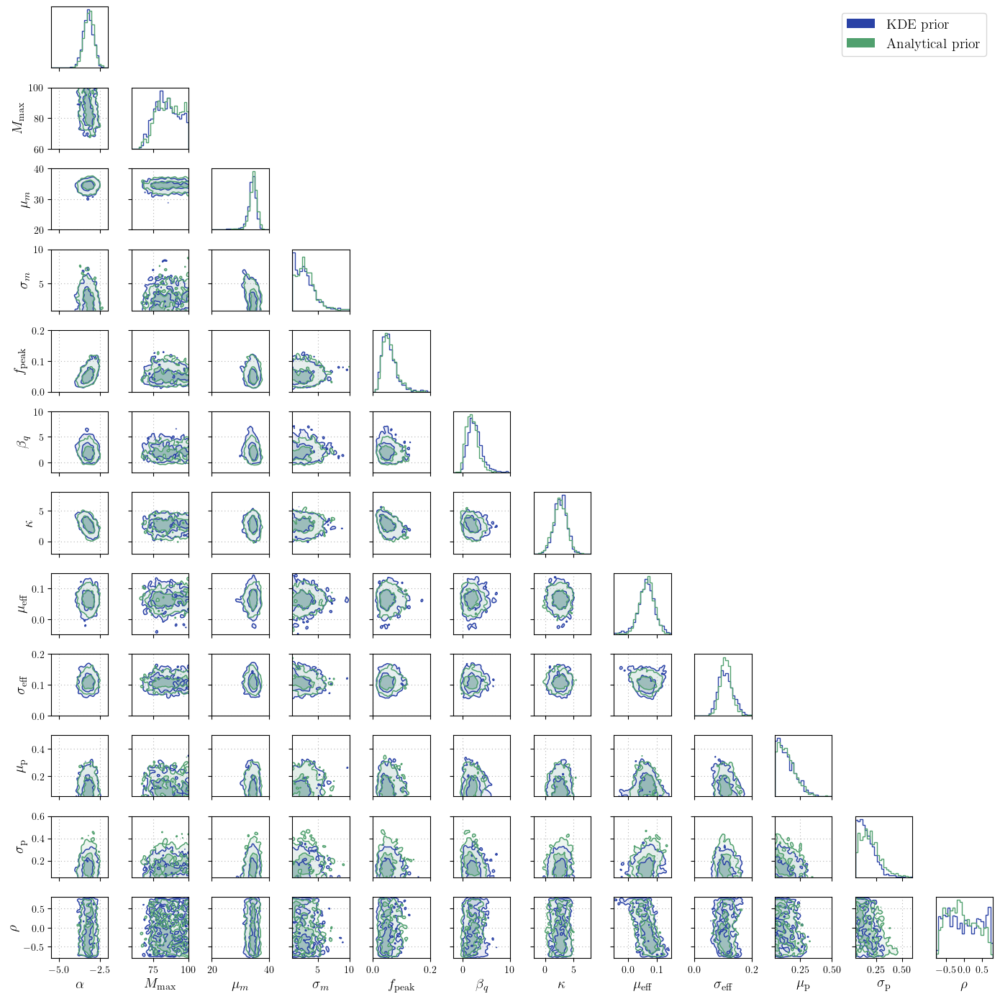

In [4]:
#Full plot
to_plots = []
for processed_samps in [processed_samps_K,processed_samps_A]:
    to_plot = {
    'alpha':{'data':processed_samps[:,0],'plot_bounds':(-5.5,-2),'label':r"$\alpha$"},
    'mMax':{'data':processed_samps[:,1],'plot_bounds':(60,100),'label':r"$M_\mathrm{max}$"},
    'm0':{'data':processed_samps[:,2],'plot_bounds':(20,40),'label':r"$\mu_m$"},
    'sigM':{'data':processed_samps[:,3],'plot_bounds':(1,10),'label':r"$\sigma_m$"},
    'fPeak':{'data':processed_samps[:,4],'plot_bounds':(0,.2),'label':r"$f_\mathrm{peak}$"},
    'bq':{'data':processed_samps[:,5],'plot_bounds':(-2,10),'label':r"$\beta_q$"},
    'kappa':{'data':processed_samps[:,6],'plot_bounds':(-2,8),'label':r"$\kappa$"},
    'muEff':{'data':processed_samps[:,-5],'plot_bounds':(-0.05,0.15),'label':r"$\mu_\mathrm{eff}$"},
    'sigEff':{'data':processed_samps[:,-4],'plot_bounds':(0,0.2),'label':r"$\sigma_\mathrm{eff}$"},
    'muP':{'data':processed_samps[:,-3],'plot_bounds':(0.05,0.5),'label':r"$\mu_\mathrm{p}$"},
    'sigP':{'data':processed_samps[:,-2],'plot_bounds':(0.05,0.6),'label':r"$\sigma_\mathrm{p}$"},
    'rho':{'data':processed_samps[:,-1],'plot_bounds':(-0.8,0.8),'label':r"$\rho$"}
    }
    to_plots.append(to_plot)

fig = plt.figure(figsize=(14,14))
plot_colors = [plot_blue,plot_green]
labels=["KDE prior",'Analytical prior']
plot_corner_overlay(fig,to_plots,plot_colors,labels=labels,bins=25,fill = True)
plt.tight_layout()
fig.savefig('Corner_Full.pdf',bbox_inches='tight')
plt.show()

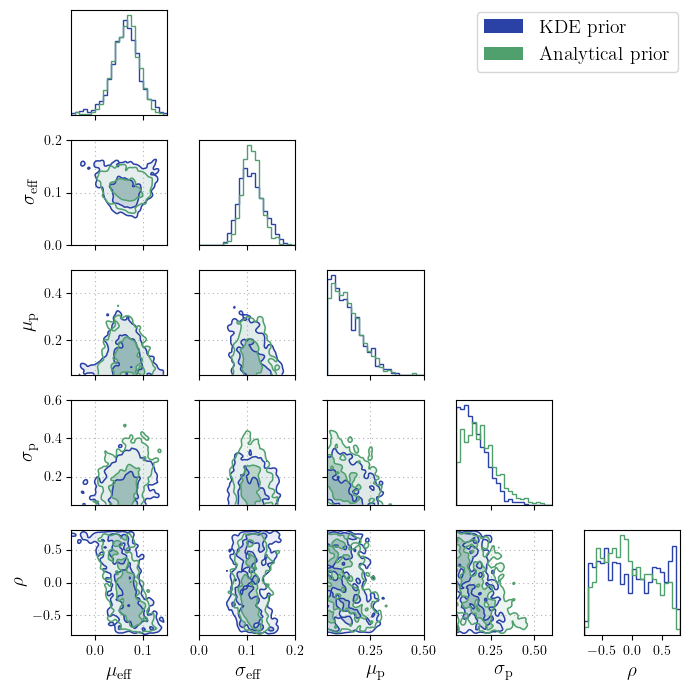

In [5]:
to_plots = []
for processed_samps in [processed_samps_K,processed_samps_A]:
    to_plot = {
    'muEff':{'data':processed_samps[:,-5],'plot_bounds':(-0.05,0.15),'label':r"$\mu_\mathrm{eff}$"},
    'sigEff':{'data':processed_samps[:,-4],'plot_bounds':(0,0.2),'label':r"$\sigma_\mathrm{eff}$"},
    'muP':{'data':processed_samps[:,-3],'plot_bounds':(0.05,0.5),'label':r"$\mu_\mathrm{p}$"},
    'sigP':{'data':processed_samps[:,-2],'plot_bounds':(0.05,0.6),'label':r"$\sigma_\mathrm{p}$"},
    'rho':{'data':processed_samps[:,-1],'plot_bounds':(-0.8,0.8),'label':r"$\rho$"}
    }
    to_plots.append(to_plot)

fig = plt.figure(figsize=(7,7))
plot_colors = [plot_blue,plot_green]
labels=["KDE prior",'Analytical prior']
plot_corner_overlay(fig,to_plots,plot_colors,labels=labels,bins=25,fill = True)
plt.tight_layout()
fig.savefig('Corner_Spins.pdf',bbox_inches='tight')
plt.show()

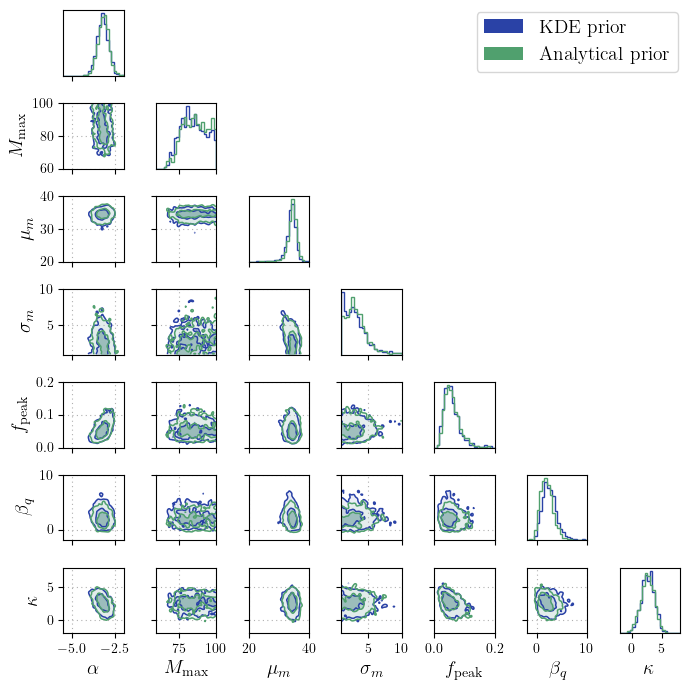

In [6]:
#Full plot
to_plots = []
for processed_samps in [processed_samps_K,processed_samps_A]:
    to_plot = {
    'alpha':{'data':processed_samps[:,0],'plot_bounds':(-5.5,-2),'label':r"$\alpha$"},
    'mMax':{'data':processed_samps[:,1],'plot_bounds':(60,100),'label':r"$M_\mathrm{max}$"},
    'm0':{'data':processed_samps[:,2],'plot_bounds':(20,40),'label':r"$\mu_m$"},
    'sigM':{'data':processed_samps[:,3],'plot_bounds':(1,10),'label':r"$\sigma_m$"},
    'fPeak':{'data':processed_samps[:,4],'plot_bounds':(0,.2),'label':r"$f_\mathrm{peak}$"},
    'bq':{'data':processed_samps[:,5],'plot_bounds':(-2,10),'label':r"$\beta_q$"},
    'kappa':{'data':processed_samps[:,6],'plot_bounds':(-2,8),'label':r"$\kappa$"},
    }
    to_plots.append(to_plot)

fig = plt.figure(figsize=(7,7))
plot_colors = [plot_blue,plot_green]
labels=["KDE prior",'Analytical prior']
plot_corner_overlay(fig,to_plots,plot_colors,labels=labels,bins=25,fill = True)
plt.tight_layout()
#fig.savefig('Corner_Full.pdf',bbox_inches='tight')
plt.show()

<Figure size 640x480 with 0 Axes>

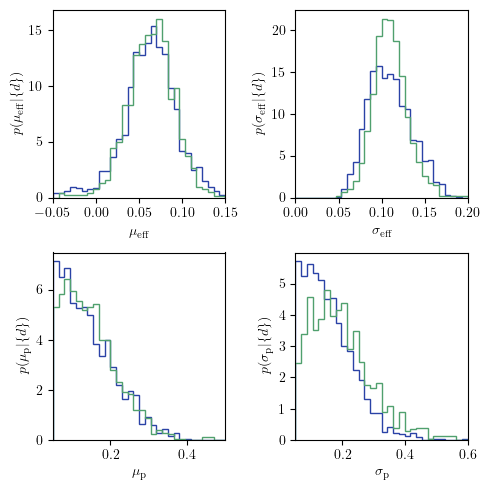

In [7]:
to_plots = []
for processed_samps in [processed_samps_K,processed_samps_A]:
    to_plot = {
    'muEff':{'data':processed_samps[:,-5],'plot_bounds':(-0.05,0.15),'label':r"$\mu_\mathrm{eff}$"},
    'sigEff':{'data':processed_samps[:,-4],'plot_bounds':(0,0.2),'label':r"$\sigma_\mathrm{eff}$"},
    'muP':{'data':processed_samps[:,-3],'plot_bounds':(0.05,0.5),'label':r"$\mu_\mathrm{p}$"},
    'sigP':{'data':processed_samps[:,-2],'plot_bounds':(0.05,0.6),'label':r"$\sigma_\mathrm{p}$"},
    }
    to_plots.append(to_plot)

fig = plt.figure()
plot_colors = [plot_blue,plot_green]
labels=["KDE prior",'Analytical prior']
fig,axes = plt.subplots(2,2,figsize=(5,5))
for i in range(4):
    if i < 2:
        ax = axes[0][i]
    else:
        ax = axes[1][i-2]
    data_type = list(to_plots[0].keys())[i]
    for j in range(2):
        ax.hist(to_plots[j][data_type]['data'],color=plot_colors[j],density=True,
               range = to_plots[j][data_type]['plot_bounds'],bins=30,histtype='step')
    ax.set_xlim(to_plots[j][data_type]['plot_bounds'])
    ax.set_xlabel(to_plots[j][data_type]['label'])
    ax.set_ylabel(r'$p$('+to_plots[j][data_type]['label']+r'{$|\{d\}$})')
    
#plot_corner_overlay(fig,to_plots,plot_colors,labels=labels,bins=25,fill = True)
plt.tight_layout()
#fig.savefig('Corner_Spins.pdf',bbox_inches='tight')
plt.show()

In [8]:
ax

<Axes: xlabel='$\\sigma_\\mathrm{p}$', ylabel='$p$($\\sigma_\\mathrm{p}${$|\\{d\\}$})'>

In [9]:
to_plots[0]['muP']['data']

memmap([0.06272087, 0.05140136, 0.08437473, ..., 0.08416526, 0.0846729 ,
        0.0574224 ])

In [10]:
to_plots

[{'muEff': {'data': memmap([ 0.06960355,  0.09911388,  0.06816211, ..., -0.0238805 ,
            0.05860593,  0.07502295]),
   'plot_bounds': (-0.05, 0.15),
   'label': '$\\mu_\\mathrm{eff}$'},
  'sigEff': {'data': memmap([0.14432109, 0.11698304, 0.09746699, ..., 0.1609225 , 0.12330585,
           0.09011125]),
   'plot_bounds': (0, 0.2),
   'label': '$\\sigma_\\mathrm{eff}$'},
  'muP': {'data': memmap([0.06272087, 0.05140136, 0.08437473, ..., 0.08416526, 0.0846729 ,
           0.0574224 ]),
   'plot_bounds': (0.05, 0.5),
   'label': '$\\mu_\\mathrm{p}$'},
  'sigP': {'data': memmap([0.10842902, 0.23028893, 0.1607378 , ..., 0.1209047 , 0.21942209,
           0.22599092]),
   'plot_bounds': (0.05, 0.6),
   'label': '$\\sigma_\\mathrm{p}$'}},
 {'muEff': {'data': memmap([0.0971909 , 0.08199677, 0.10096814, ..., 0.09343964, 0.06473046,
           0.05304567]),
   'plot_bounds': (-0.05, 0.15),
   'label': '$\\mu_\\mathrm{eff}$'},
  'sigEff': {'data': memmap([0.08930595, 0.11894861, 0.1087305

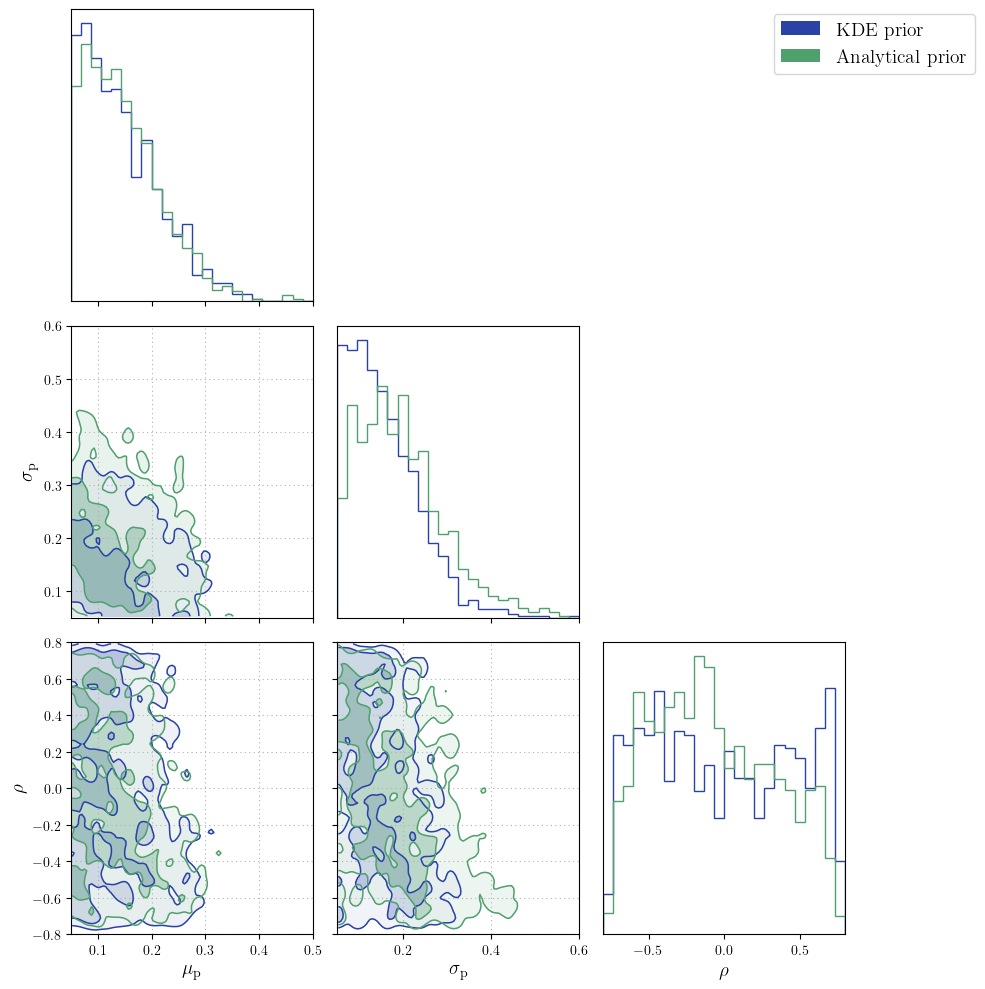

In [11]:
#Xp related parameter only

fig = plt.figure(figsize=(10,10))
to_plots = []
for processed_samps in [processed_samps_K,processed_samps_A]:
    to_plot = {
    'muP':{'data':processed_samps[:,-3],'plot_bounds':(0.05,0.5),'label':r"$\mu_\mathrm{p}$"},
    'sigP':{'data':processed_samps[:,-2],'plot_bounds':(0.05,0.6),'label':r"$\sigma_\mathrm{p}$"},
    'rho':{'data':processed_samps[:,-1],'plot_bounds':(-0.8,0.8),'label':r"$\rho$"}
    }
    to_plots.append(to_plot)
plot_corner_overlay(fig,to_plots,plot_colors,labels=labels,bins=25,fill=True)
fig.savefig('Corner_Xp_related.pdf',bbox_inches='tight')
plt.show()

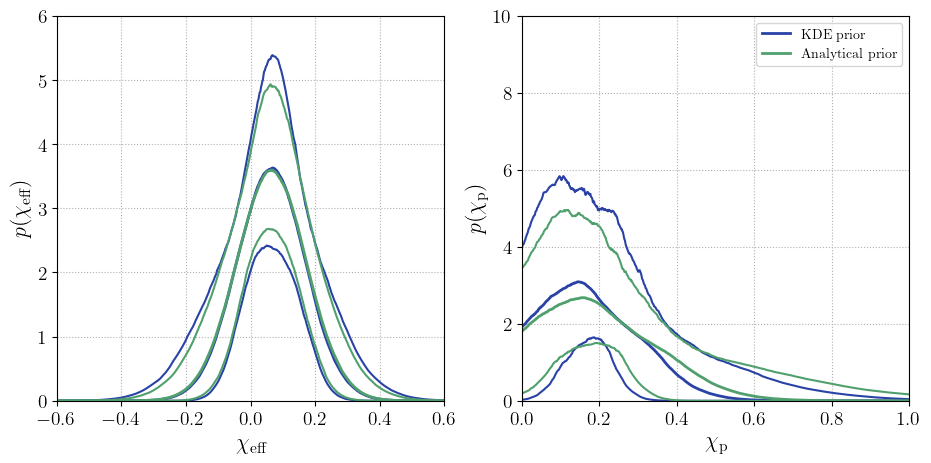

In [12]:
fig,axes = plt.subplots(1,2,figsize=(11,5))
labels=['KDE prior',"Analytical prior","KDE prior (Downsampled)",]
plot_colors = [plot_blue,plot_green,plot_orange]
effp = ['eff','p']

for k in range(2):
    ax = axes[k]
    x_grid = np.linspace(-1+k,1,1001)
    for j,processed_samps in enumerate([processed_samps_K,processed_samps_A]):
        mu = processed_samps[:,-5+2*k]
        sig = processed_samps[:,-4+2*k]
        ys = np.zeros((mu.size,x_grid.size))
        for i in range(mu.size):
            y = calculate_Gaussian(x_grid,mu[i],sig[i]**2.,-1+k,1)
            #ax.plot(x_grid,y,color=plot_colors[j],alpha=2/np.sqrt(mu.size),lw=0.2)
            ys[i,:] = y
    
        ax.plot(x_grid,np.quantile(ys,0.05,axis=0),color=plot_colors[j])
        ax.plot(x_grid,np.quantile(ys,0.50,axis=0),color=plot_colors[j],linewidth=2,label=labels[j])
        ax.plot(x_grid,np.quantile(ys,0.95,axis=0),color=plot_colors[j])
    
#ax.legend(loc='upper right',frameon=False)
    ax.set_xlim(-.6+.6*k,.6+.4*k)
    ax.set_ylim(0,6+4*k)
    ax.axes.grid(True,which='major',ls=':')
    ax.set_xlabel(r'$\chi_\mathrm{'+effp[k]+'}$',fontsize=16)
    ax.set_ylabel(r'$p(\chi_\mathrm{'+effp[k]+'})$',fontsize=16)
    ax.tick_params(labelsize=14)
ax.legend(loc='upper right')
plt.savefig('PPDs.pdf')

KDE prior
Gaussian mean = 0.131 +0.146 -0.074
Gaussian SD = 0.142 +0.163 -0.085

0.145
Analytical prior
Gaussian mean = 0.137 +0.141 -0.077
Gaussian SD = 0.183 +0.208 -0.112

0.16
KDE prior (Downsampled)
Gaussian mean = 0.140 +0.143 -0.080
Gaussian SD = 0.176 +0.149 -0.105

0.16


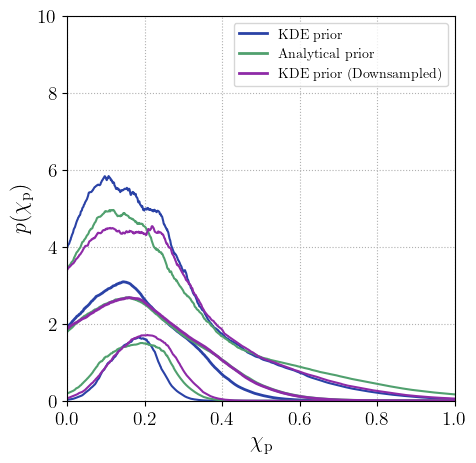

In [13]:
fig,ax = plt.subplots(figsize=(5,5))
x_grid = np.linspace(0,1,1001)
labels=['KDE prior',"Analytical prior","KDE prior (Downsampled)",]
plot_colors = [plot_blue,plot_green,plot_purple]

for j,processed_samps in enumerate([processed_samps_K,processed_samps_A,processed_samps_K0]):
    mu = processed_samps[:,-3]
    sig = processed_samps[:,-2]
    print(labels[j])
    print('Gaussian mean = {:.3f} +{:.3f} -{:.3f}'.format(np.median(mu),np.quantile(mu,0.95)-np.median(mu),np.median(mu)-np.quantile(mu,0.05)))
    print('Gaussian SD = {:.3f} +{:.3f} -{:.3f}'.format(np.median(sig),np.quantile(sig,0.95)-np.median(sig),np.median(sig)-np.quantile(sig,0.05)))
    print('')
    ys = np.zeros((mu.size,x_grid.size))
    for i in range(mu.size):
        y = calculate_Gaussian(x_grid,mu[i],sig[i]**2.,0,1)
        #ax.plot(x_grid,y,color=plot_colors[j],alpha=2/np.sqrt(mu.size),lw=0.2)
        ys[i,:] = y
    
    ax.plot(x_grid,np.quantile(ys,0.05,axis=0),color=plot_colors[j])
    ax.plot(x_grid,np.quantile(ys,0.50,axis=0),color=plot_colors[j],linewidth=2,label=labels[j])
    ax.plot(x_grid,np.quantile(ys,0.95,axis=0),color=plot_colors[j])
    
    print(x_grid[np.argmax(np.quantile(ys,0.5,axis=0))])
    
#ax.legend(loc='upper right',frameon=False)
ax.legend(loc='upper right')
ax.set_xlim(0,1)
ax.set_ylim(0,10)
ax.axes.grid(True,which='major',ls=':')
ax.set_xlabel(r'$\chi_\mathrm{p}$',fontsize=16)
ax.set_ylabel(r'$p(\chi_\mathrm{p})$',fontsize=16)
ax.tick_params(labelsize=14)
plt.savefig('PPD_Xp.pdf')

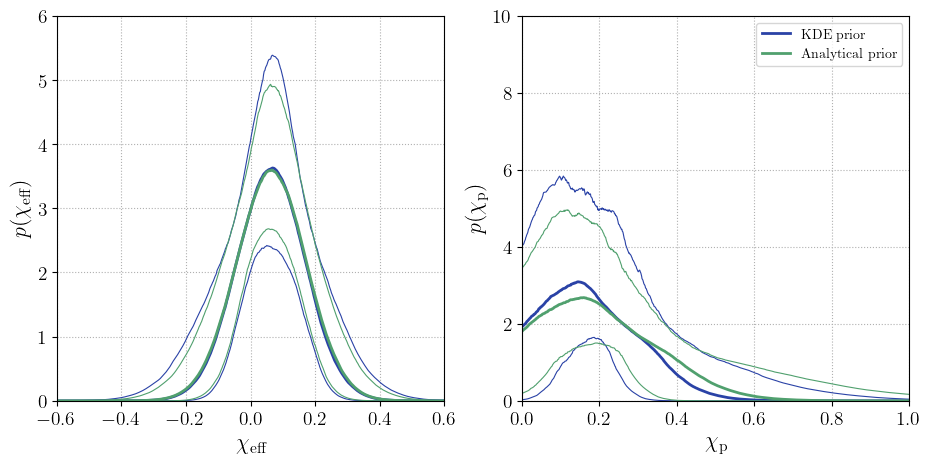

In [14]:
fig,axes = plt.subplots(1,2,figsize=(11,5))
labels=['KDE prior',"Analytical prior","KDE prior (Downsampled)",]
plot_colors = [plot_blue,plot_green,plot_purple]
lss = ['-','-','--']
effp = ['eff','p']

for k in range(2):
    ax = axes[k]
    x_grid = np.linspace(-1+k,1,1001)
    for j,processed_samps in enumerate([processed_samps_K,processed_samps_A]):
        mu = processed_samps[:,-5+2*k]
        sig = processed_samps[:,-4+2*k]
        ys = np.zeros((mu.size,x_grid.size))
        for i in range(mu.size):
            y = calculate_Gaussian(x_grid,mu[i],sig[i]**2.,-1+k,1)
            #ax.plot(x_grid,y,color=plot_colors[j],alpha=1/np.sqrt(mu.size),lw=0.2)
            ys[i,:] = y
    
        ax.plot(x_grid,np.quantile(ys,0.05,axis=0),linestyle=lss[j],color=plot_colors[j],linewidth=0.8)
        ax.plot(x_grid,np.quantile(ys,0.50,axis=0),linestyle=lss[j],color=plot_colors[j],linewidth=2,label=labels[j])
        ax.plot(x_grid,np.quantile(ys,0.95,axis=0),linestyle=lss[j],color=plot_colors[j],linewidth=0.8)
    
#ax.legend(loc='upper right',frameon=False)
    ax.set_xlim(-.6+.6*k,.6+.4*k)
    ax.set_ylim(0,6+4*k)
    ax.axes.grid(True,which='major',ls=':')
    ax.set_xlabel(r'$\chi_\mathrm{'+effp[k]+'}$',fontsize=16)
    ax.set_ylabel(r'$p(\chi_\mathrm{'+effp[k]+'})$',fontsize=16)
    ax.tick_params(labelsize=14)
ax.legend(loc='upper right')
plt.savefig('PPDs.pdf')

KDE prior
Gaussian mean = 0.064 +0.049 -0.055
Gaussian SD = 0.108 +0.047 -0.035

Analytical prior
Gaussian mean = 0.064 +0.041 -0.043
Gaussian SD = 0.109 +0.036 -0.030

KDE prior (Downsampled)
Gaussian mean = 0.065 +0.042 -0.049
Gaussian SD = 0.111 +0.039 -0.035



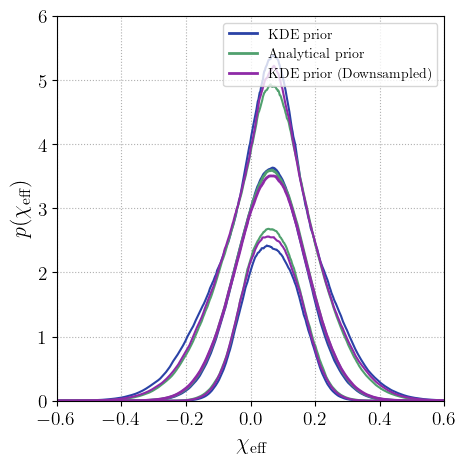

In [15]:
fig,ax = plt.subplots(figsize=(5,5))
x_grid = np.linspace(-1,1,1001)

for j,processed_samps in enumerate([processed_samps_K,processed_samps_A,processed_samps_K0]):
    mu = processed_samps[:,-5]
    sig = processed_samps[:,-4]
    print(labels[j])
    print('Gaussian mean = {:.3f} +{:.3f} -{:.3f}'.format(np.median(mu),np.quantile(mu,0.95)-np.median(mu),np.median(mu)-np.quantile(mu,0.05)))
    print('Gaussian SD = {:.3f} +{:.3f} -{:.3f}'.format(np.median(sig),np.quantile(sig,0.95)-np.median(sig),np.median(sig)-np.quantile(sig,0.05)))
    print('')
    
    ys = np.zeros((mu.size,x_grid.size))
    for i in range(mu.size):
        y = calculate_Gaussian(x_grid,mu[i],sig[i]**2.,-1,1)
        #ax.plot(x_grid,y,color=plot_color,alpha=0.2,lw=0.2)
        ys[i,:] = y
    
    ax.plot(x_grid,np.quantile(ys,0.05,axis=0),color=plot_colors[j])
    ax.plot(x_grid,np.quantile(ys,0.50,axis=0),color=plot_colors[j],linewidth=2,label=labels[j])
    ax.plot(x_grid,np.quantile(ys,0.95,axis=0),color=plot_colors[j])
    
ax.legend(loc='upper right')
ax.set_xlim(-.6,.6)
ax.set_ylim(0,6)
ax.axes.grid(True,which='major',ls=':')
ax.set_xlabel(r'$\chi_\mathrm{eff}$',fontsize=16)
ax.set_ylabel(r'$p(\chi_\mathrm{eff})$',fontsize=16)
ax.tick_params(labelsize=14)
plt.savefig('PPD_Xeff.pdf')

ここからlog(hyper-loglikelihood)の比較。原理的には
$$
\log(\mathcal{L}_A(\{d\}|\Lambda))-\log(\mathcal{L}_K(\{d\}|\Lambda))
$$
の比較。Parameter distributionでは見えないsystematic biasを探索する。

In [16]:
def logp_powerLawPeak_components(c,sampleDict,injectionDict,priorDict,sampler='emcee',chi_min=-1):

    """
    This is written based on logp_powerLaoPeak, but it returns each factor within the likelihood separately.
    """

    to_return = {}

    #logP = 0.

    # Read parameters
    lmbda = c[0]
    mMax = c[1]
    m0 = c[2]
    sigM = c[3]
    fPeak = c[4]
    bq = c[5]
    kappa = c[6]
    mu_eff = c[7]
    sigma_eff = c[8]
    mu_p = c[9]
    sigma_p = c[10]
    rho = c[11]

    # Call priors as necessary
    if sampler=="emcee":

        # Flat priors, reject samples past boundaries
        if not inPrior_powerLawPeak(c,priorDict):
            to_return["log_prior"] = -np.inf
        else:
            to_return["log_prior"] = -kappa**2./(2.*priorDict['sig_kappa']**2.)

        # Gaussian prior on kappa
        #logP += -kappa**2./(2.*priorDict['sig_kappa']**2.)

    # Unpack injections
    m1_det = injectionDict['m1']
    m2_det = injectionDict['m2']
    z_det = injectionDict['z']
    dVdz_det = injectionDict['dVdz']
    Xeff_det = injectionDict['Xeff']
    Xp_det = injectionDict['Xp']
    pop_reweight = injectionDict['weights']
    q_det = m2_det/m1_det
    mtot_det = m1_det+m2_det

    mMin = priorDict['mMin']

    # Reweight injection probabilities
    p_det_Xeff_Xp = calculate_Gaussian_2D(Xeff_det, Xp_det, mu_eff, sigma_eff**2, mu_p, sigma_p**2., rho, chi_min=chi_min)
    p_det_m2 = (1.+bq)*np.power(m2_det,bq)/(np.power(m1_det,1.+bq)-mMin**(1.+bq))
    p_det_m2[m2_det<mMin] = 0.
    p_det_z = dVdz_det*np.power(1.+z_det,kappa-1.)

    # PLPeak distribution on p(m1)
    p_det_m1_pl = (1.+lmbda)*m1_det**lmbda/(mMax**(1.+lmbda) - mMin**(1.+lmbda))
    p_det_m1_pl[m1_det>mMax] = 0
    p_det_m1_peak = np.exp(-0.5*(m1_det-m0)**2./sigM**2)/np.sqrt(2.*np.pi*sigM**2.)
    p_det_m1 = fPeak*p_det_m1_peak + (1.-fPeak)*p_det_m1_pl

    # Construct full weighting factors
    det_weights = p_det_Xeff_Xp*p_det_m1*p_det_m2*p_det_z*pop_reweight
    if np.max(det_weights)==0:
        to_return["log_detEff"] = -np.inf
    else:
        # Check for sufficient sampling size
        # Specifically require 4*Ndet effective detections, according to https://arxiv.org/abs/1904.10879
        nEvents = len(sampleDict)
        Nsamp = np.sum(det_weights)**2/np.sum(det_weights**2)
        if Nsamp<=4*nEvents:
            if sampler=="emcee": print("Insufficient mock detections:",c)
            #return -np.inf
            to_return["log_detEff"] = -np.inf
        else:
            # Add detection efficiency term to log likelihood
            #log_detEff = -nEvents*np.log(np.sum(det_weights))
            #logP += log_detEff
            to_return["log_detEff"] = -nEvents*np.log(np.sum(det_weights))

    # Loop across samples
    for event in sampleDict:

        # Grab samples
        m1_sample = sampleDict[event]['m1']
        m2_sample = sampleDict[event]['m2']
        Xeff_sample = sampleDict[event]['Xeff']
        Xp_sample = sampleDict[event]['Xp']
        z_sample = sampleDict[event]['z']
        spin_prior = sampleDict[event]['joint_priors']
        weights = sampleDict[event]['weights']
        q_sample = m2_sample/m1_sample
        
        # Chi probability - Gaussian: P(chi_eff | mu, sigma2)
        p_Chi = calculate_Gaussian_2D(Xeff_sample, Xp_sample, mu_eff, sigma_eff**2., mu_p, sigma_p**2., rho, chi_min=chi_min)

        # p(m1)
        p_m1_pl = (1.+lmbda)*m1_sample**lmbda/(mMax**(1.+lmbda) - mMin**(1.+lmbda))
        p_m1_pl[m1_sample>mMax] = 0.
        p_m1_peak = np.exp(-0.5*(m1_sample-m0)**2./sigM**2)/np.sqrt(2.*np.pi*sigM**2.)
        p_m1 = fPeak*p_m1_peak + (1.-fPeak)*p_m1_pl
        old_m1_prior = np.ones(m1_sample.size)
        
        # p(m2)
        p_m2 = (1.+bq)*np.power(m2_sample,bq)/(np.power(m1_sample,1.+bq)-mMin**(1.+bq))
        old_m2_prior = np.ones(m2_sample.size)
        p_m2[m2_sample<mMin]=0

        # p(z)
        p_z = np.power(1.+z_sample,kappa-1.)
        old_pz_prior = (1.+z_sample)**(2.7-1.)
        
        # Evaluate marginalized likelihood
        nSamples = p_Chi.size

        integrand = p_Chi*p_m1*p_m2*p_z*weights/spin_prior/old_m1_prior/old_m2_prior/old_pz_prior
        neff_singleEvent = np.sum(integrand)**2/np.sum(integrand**2)
        if neff_singleEvent<10:
            #print(event,neff_singleEvent)
            to_return[event] = -np.inf
        else:
            to_return[event] = np.log(np.sum(integrand)/nSamples)

        # Summation
        #logP += np.log(pEvidence)

    return to_return


In [17]:
injectionDict_K = np.load("../../o3b-pop-studies-rerun/code/injectionDict_rerun_directMixture_FAR_1_in_1.pickle", allow_pickle=True)
injectionDict_A = np.load("../code/injectionDict_rerun_directMixture_FAR_1_in_1_A.pickle", allow_pickle=True)

In [18]:
sampleDict_K = np.load("../../o3b-pop-studies-rerun/input/sampleDict_FAR_1_in_1_yr_rerun.pickle", allow_pickle=True)
sampleDict_K.pop('S190814bv')
sampleDict_A = np.load("../input/sampleDict_FAR_1_in_1_yr_rerun_A.pickle", allow_pickle=True)
sampleDict_A.pop('S190814bv')

{'Xeff': array([-0.00524536, -0.0187515 , -0.06449926, ...,  0.0104752 ,
        -0.00308202,  0.00348407]),
 'Xp': array([0.01811832, 0.08319857, 0.06017212, ..., 0.02918333, 0.04492748,
        0.03293016]),
 'joint_priors': array([11.49956376,  9.45994351,  6.40823812, ..., 11.76115254,
        11.97852265, 11.88127054]),
 'Xeff_priors': array([2.25710186, 2.08043616, 1.57947851, ..., 2.19952561, 2.29062276,
        2.28044743]),
 'weights': array([10.14733351,  9.87511512, 10.17374387, ...,  9.99144491,
        10.0766163 ,  9.89239442]),
 'm1': array([23.06465393, 22.72027078, 22.22909882, ..., 23.70536107,
        23.23379002, 22.99417161]),
 'm2': array([2.597224  , 2.60275801, 2.67095322, ..., 2.53351471, 2.57426482,
        2.59041867]),
 'a1': array([0.03213896, 0.06137152, 0.01358353, ..., 0.0397009 , 0.04520966,
        0.00949304]),
 'a2': array([0.28412338, 0.91419295, 0.81242646, ..., 0.3010839 , 0.0434786 ,
        0.3752892 ]),
 'cost1': array([-0.88065533, -0.22845464

In [19]:
sampleDict_A.keys()

dict_keys(['GW150914', 'GW151012', 'GW151226', 'GW170104', 'GW170608', 'GW170729', 'GW170809', 'GW170814', 'GW170818', 'GW170823', 'S190408an', 'S190412m', 'S190413ac', 'S190413i', 'S190421ar', 'S190503bf', 'S190512at', 'S190513bm', 'S190517h', 'S190519bj', 'S190521g', 'S190521r', 'S190527w', 'S190602aq', 'S190620e', 'S190630ag', 'S190701ah', 'S190706ai', 'S190707q', 'S190708ap', 'S190719an', 'S190720a', 'S190725t', 'S190727h', 'S190728q', 'S190731aa', 'S190803e', 'S190805bq', 'S190828j', 'S190828l', 'S190910s', 'S190915ak', 'S190924h', 'S190925ad', 'S190929d', 'S190930s', 'S191103a', 'S191105e', 'S191109d', 'S191127p', 'S191129u', 'S191204r', 'S191215w', 'S191216ap', 'S191222n', 'S191230an', 'S200112r', 'S200128d', 'S200129m', 'S200202ac', 'S200208q', 'S200209ab', 'S200216br', 'S200219ac', 'S200224ca', 'S200225q', 'S200302c', 'S200311bg', 'S200316bj'])

In [20]:
processed_samps = np.load('../results/processed_AllSamples_r00.npy','r')

In [21]:
processed_samps

memmap([[-3.27325707e+00,  8.36202995e+01,  3.35367482e+01, ...,
          1.05284306e-01,  3.61323832e-01, -9.41628775e-02],
        [-3.13850690e+00,  7.86273352e+01,  3.36529543e+01, ...,
          9.79724615e-02,  1.75481022e-01,  2.15739618e-02],
        [-3.18292359e+00,  7.95030800e+01,  3.61952832e+01, ...,
          8.72683579e-02,  1.96237605e-01, -3.26541485e-01],
        ...,
        [-3.03928344e+00,  8.22224299e+01,  3.40628115e+01, ...,
          1.20498942e-01,  7.46887641e-02,  4.83796721e-01],
        [-3.28020452e+00,  9.83467336e+01,  3.50222654e+01, ...,
          2.00633235e-01,  8.82876208e-02,  3.54474089e-01],
        [-3.30952786e+00,  9.71543450e+01,  3.64041391e+01, ...,
          2.55887510e-01,  2.22886906e-01, -4.39107171e-01]])

In [22]:
log_posterior_A_components = lambda p: logp_powerLawPeak_components(p, sampleDict_A, injectionDict_A, priorDict)

In [23]:
log_posterior_K_components = lambda p: logp_powerLawPeak_components(p, sampleDict_K, injectionDict_K, priorDict)


In [24]:
priorDict = {
    'lmbda':(-5,4),
    'mMax':(60,100),
    'm0':(20,100),
    'sigM':(1,10),
    'fPeak':(0,1),
    'bq':(-2,10),
    'sig_kappa':6.,
    'mu_eff':(-1,1),
    'sigma_eff':(0.05,1.),
    'mu_p':(0.05,1),
    'sigma_p':(0.05,1.),
    'rho':(-0.75,0.75),
    'mMin':5.
}

In [25]:
from gaussianLikelihoods import *
samples = {
    "lmbda": processed_samps[:, 0],
    "mMax": processed_samps[:, 1],
    "m0": processed_samps[:, 2],
    "sigM": processed_samps[:, 3],
    "fPeak": processed_samps[:, 4],
    "bq": processed_samps[:, 5],
    "kappa": processed_samps[:, 6],
    "mu_eff": processed_samps[:, 7],
    "sigma_eff": processed_samps[:, 8],
    "mu_p": processed_samps[:, 9],
    "sigma_p": processed_samps[:, 10],
    "rho": processed_samps[:, 11],
}
N_samps = len(samples["lmbda"])
param_names = ["lmbda", "mMax", "m0", "sigM", "fPeak", "bq", "kappa", "mu_eff", "sigma_eff", "mu_p", "sigma_p", "rho"]
samples_list = [[samples[k][i] for k in param_names] for i in range(N_samps)]
logps_K_components = []
logps_A_components = []
for i in tqdm(list(range(N_samps))):
#    logps_KDE.append(log_posterior_KDE(samples_list[i]))
#    logps_Analytical.append(log_posterior_Analytical(samples_list[i]))
    logps_K_components.append(log_posterior_K_components(samples_list[i]))
    logps_A_components.append(log_posterior_A_components(samples_list[i]))

  0%|          | 0/1120 [00:00<?, ?it/s]

In [26]:
logps_K_components = dict((k, np.array([logps_K_components[i][k] for i in range(N_samps)])) for k in logps_K_components[0].keys())
logps_A_components = dict((k, np.array([logps_A_components[i][k] for i in range(N_samps)])) for k in logps_A_components[0].keys())

In [27]:
len(logps_K_components['log_prior'])

1120

  0%|          | 0/71 [00:00<?, ?it/s]

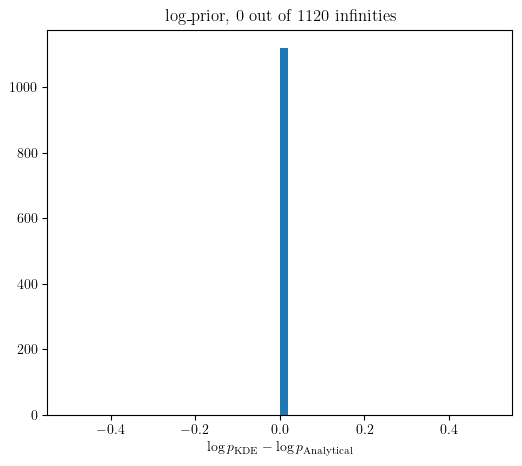

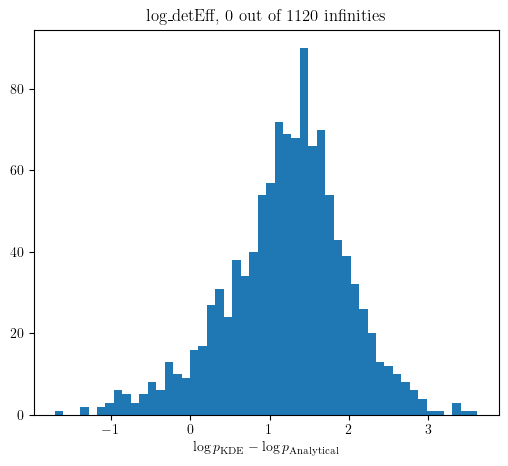

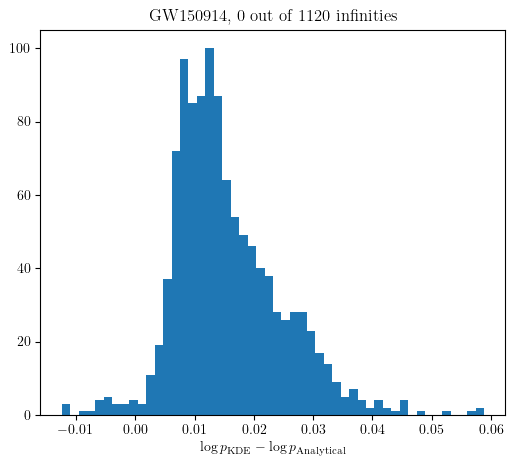

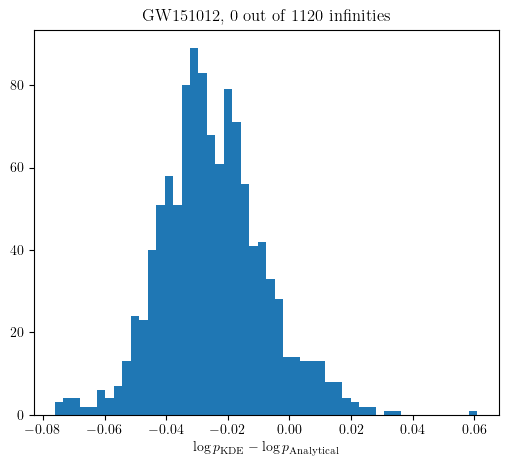

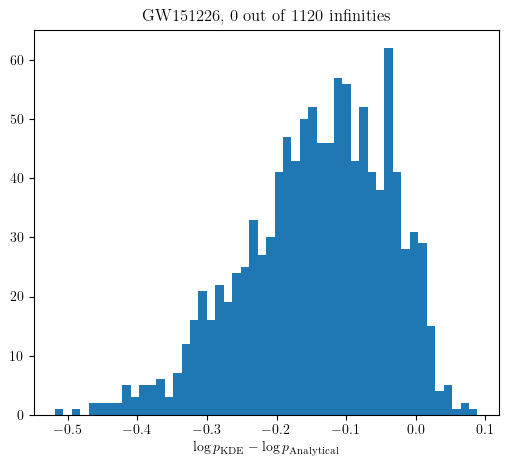

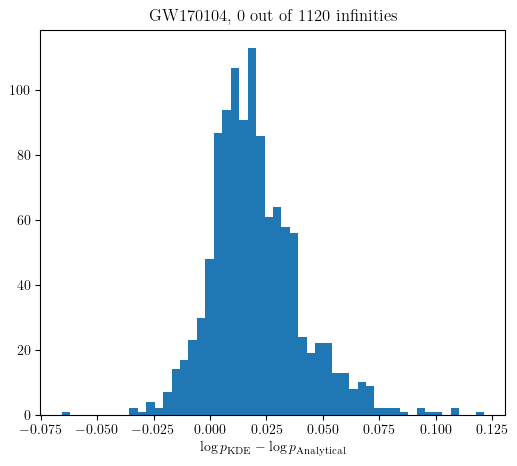

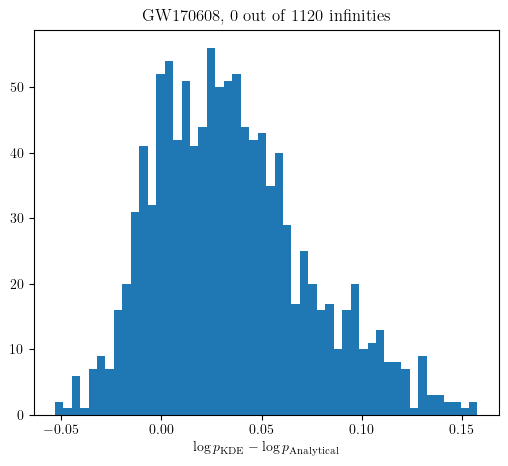

<Figure size 600x500 with 0 Axes>

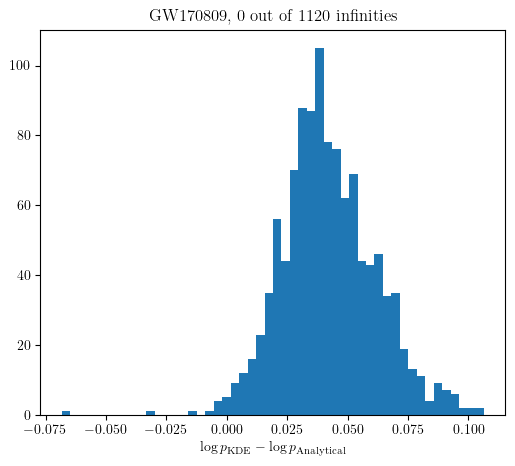

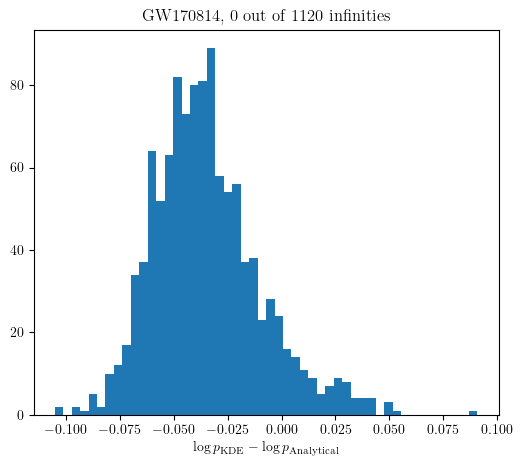

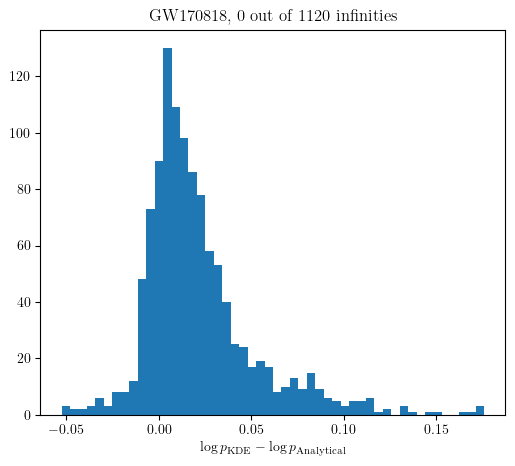

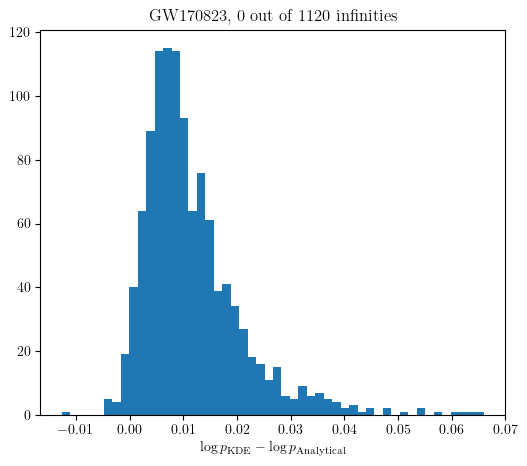

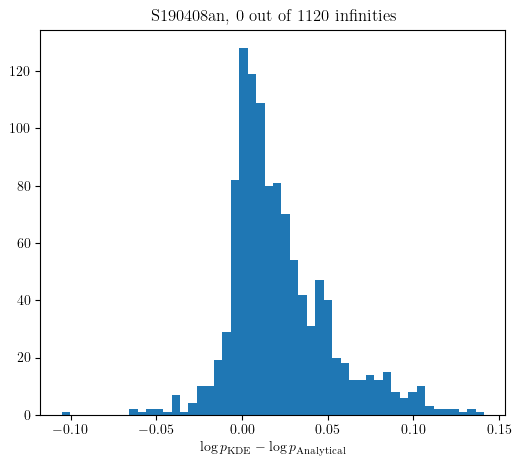

<Figure size 600x500 with 0 Axes>

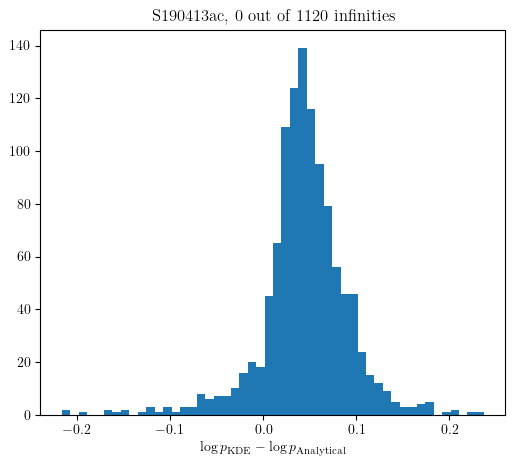

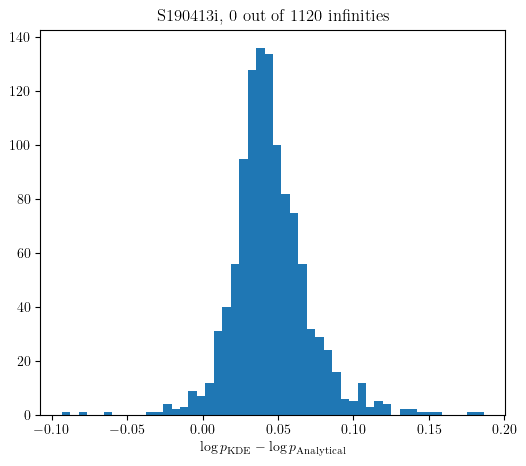

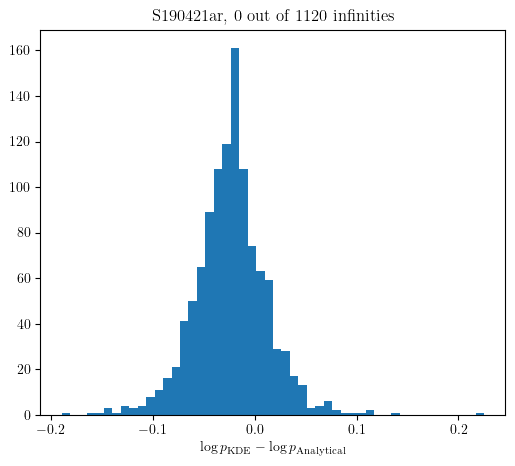

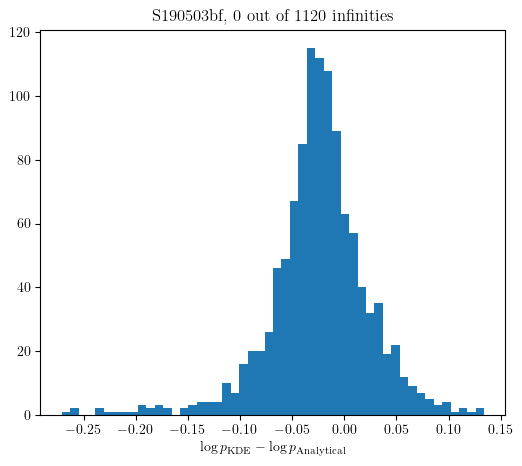

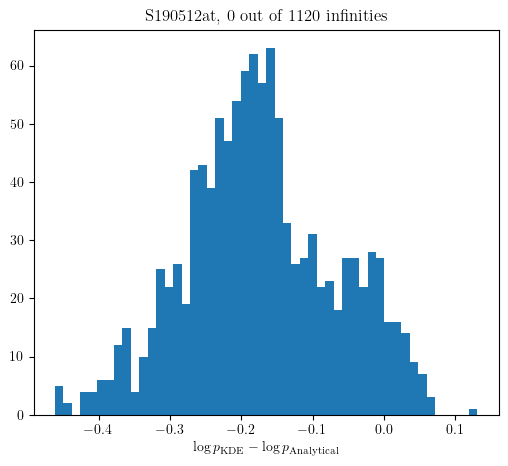

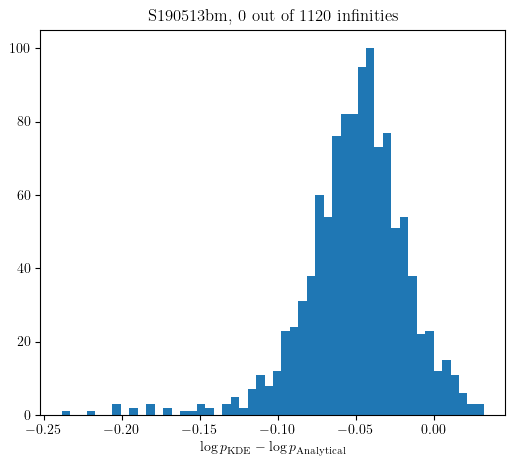

<Figure size 600x500 with 0 Axes>

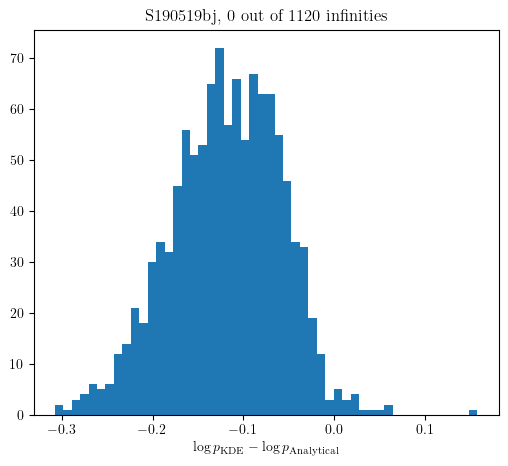

<Figure size 600x500 with 0 Axes>

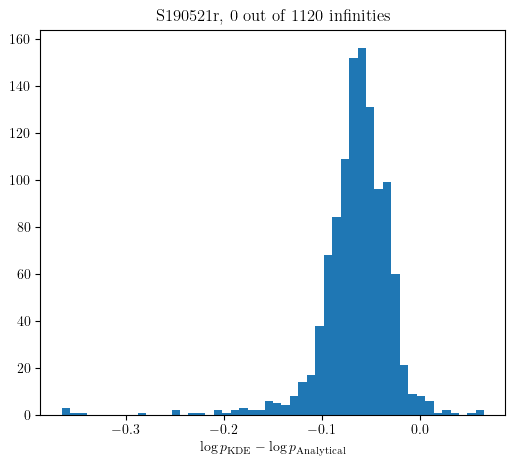

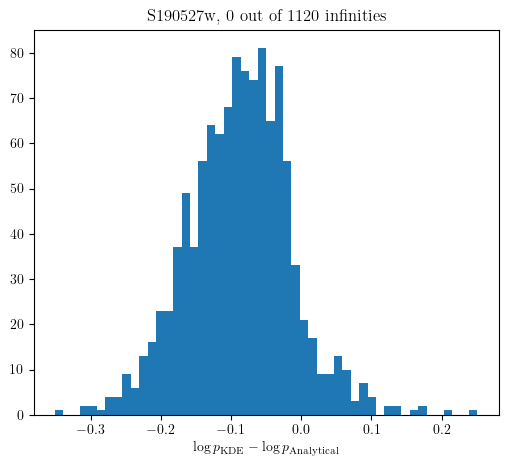

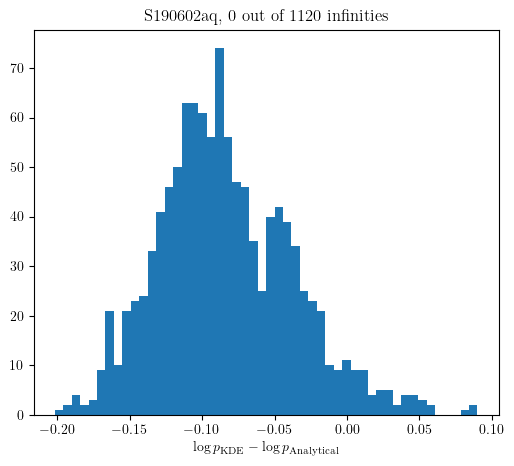

<Figure size 600x500 with 0 Axes>

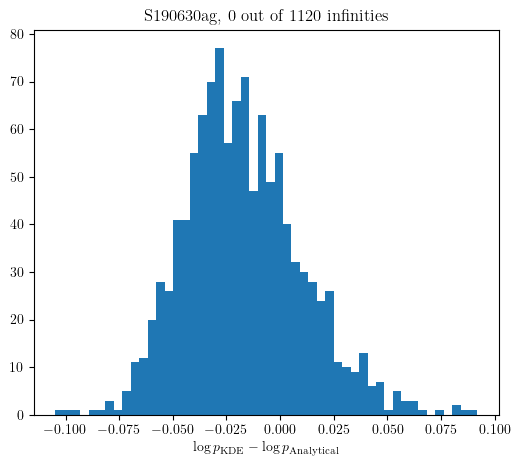

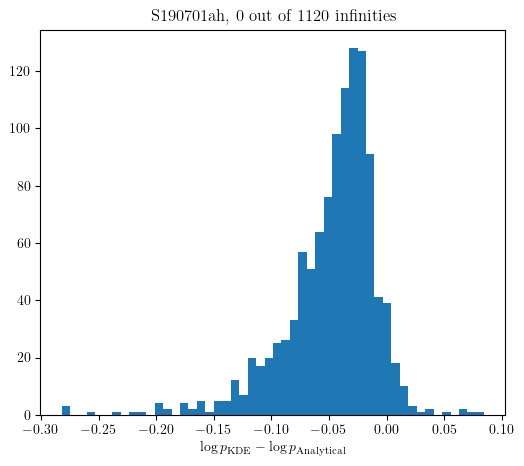

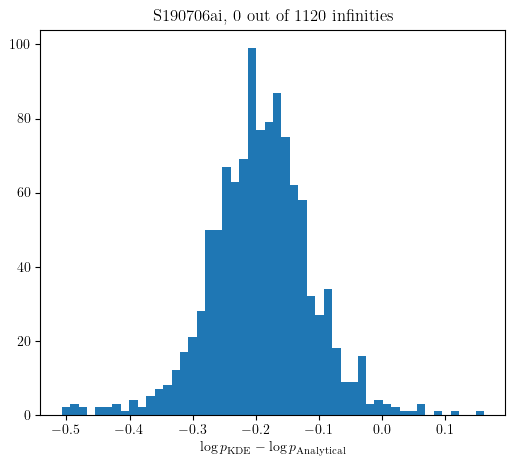

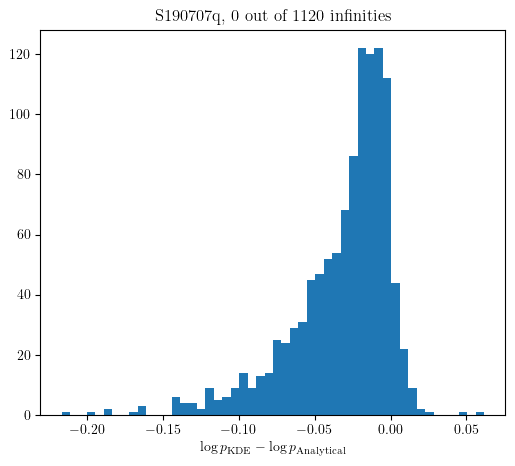

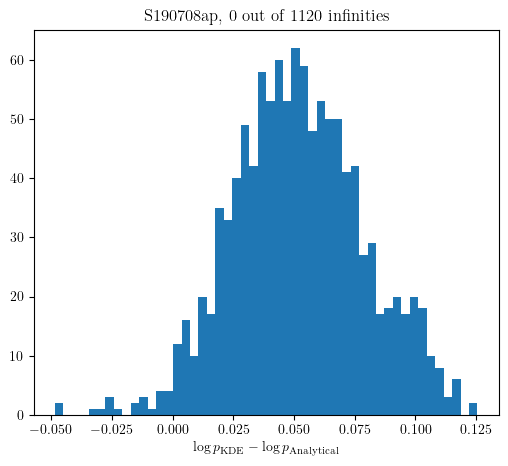

...

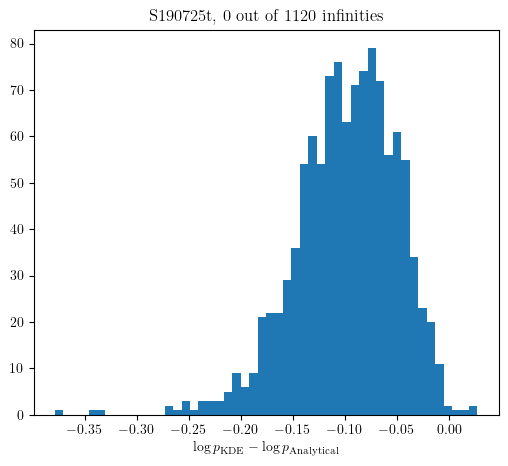

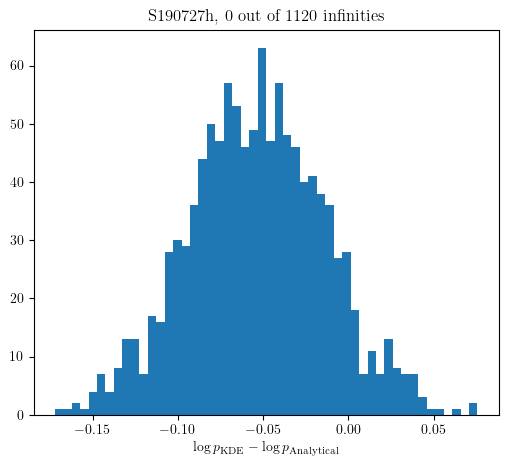

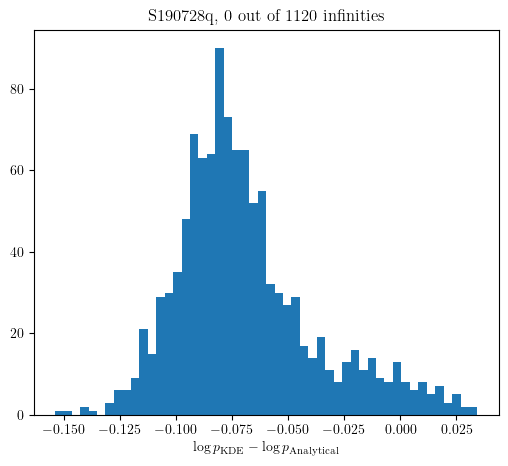

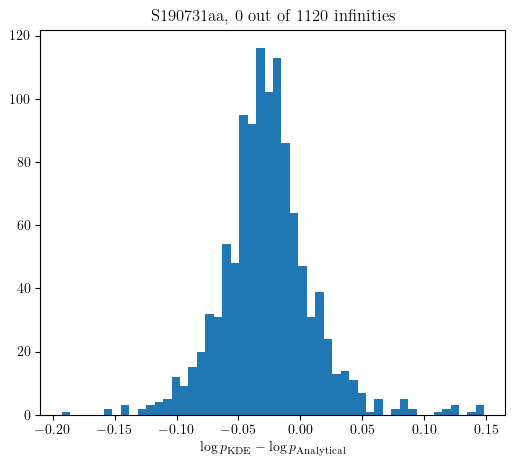

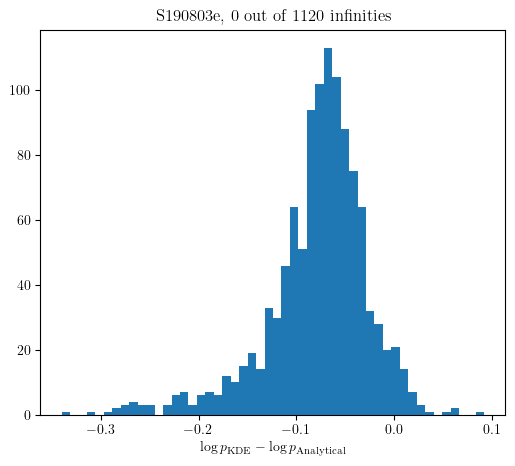

<Figure size 600x500 with 0 Axes>

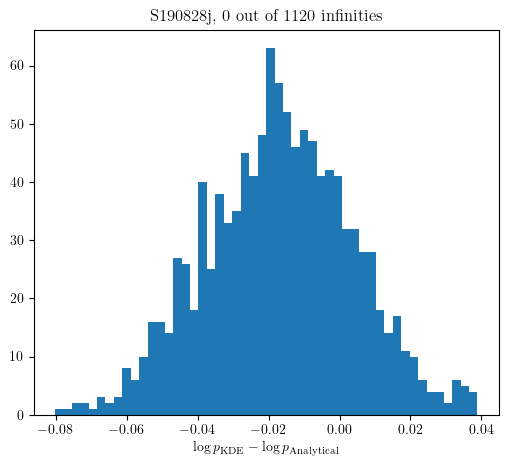

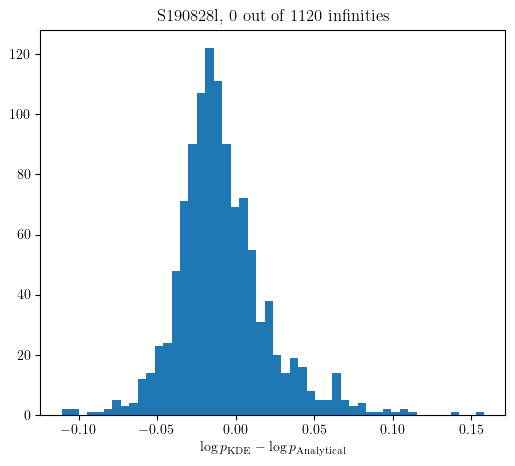

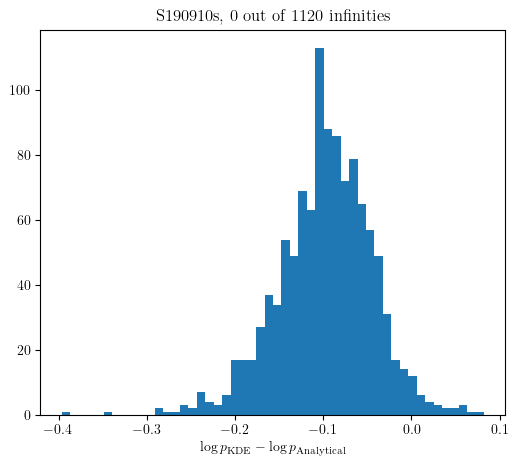

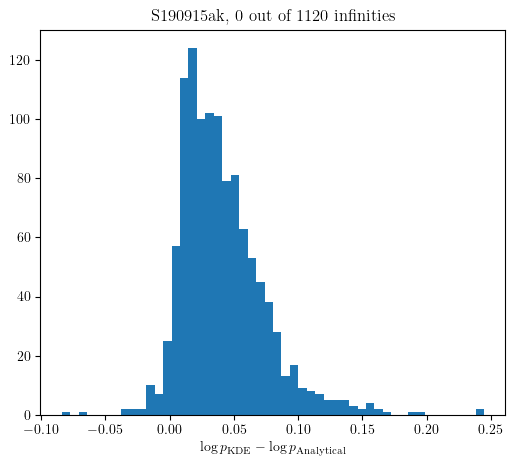

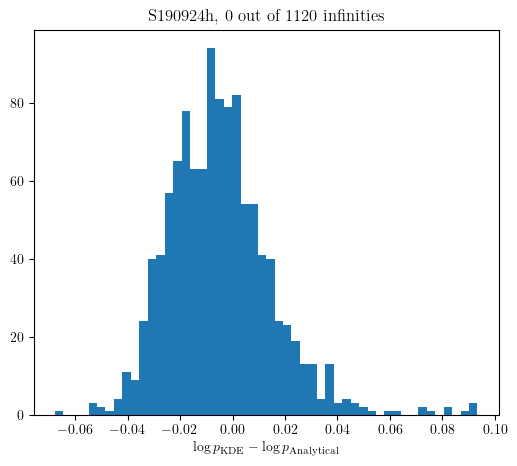

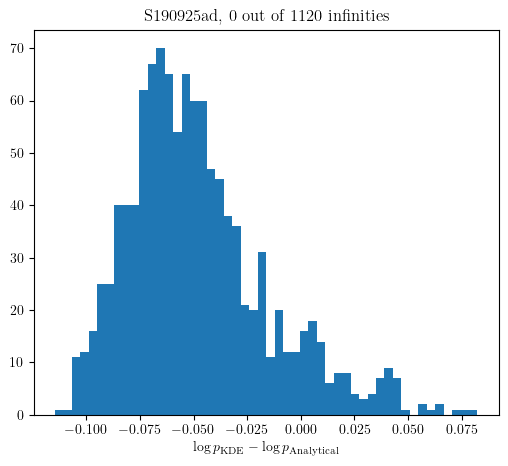

<Figure size 600x500 with 0 Axes>

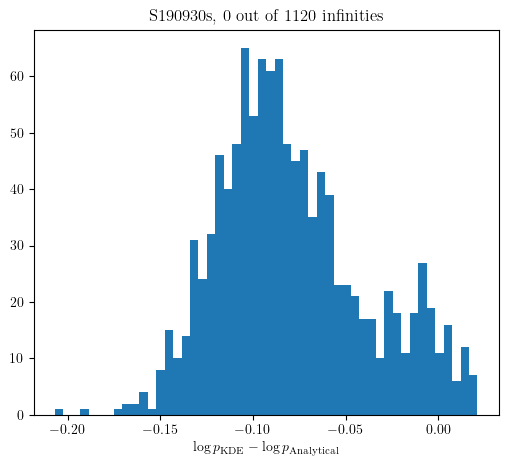

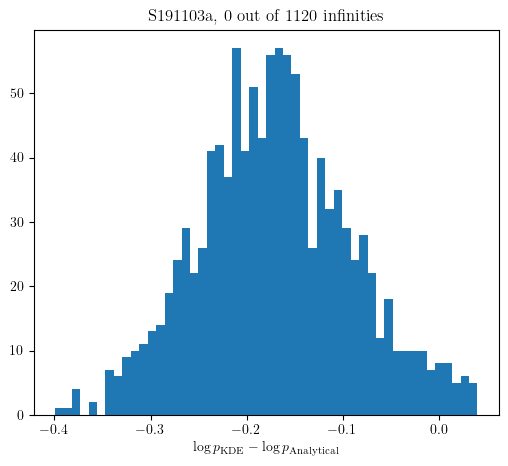

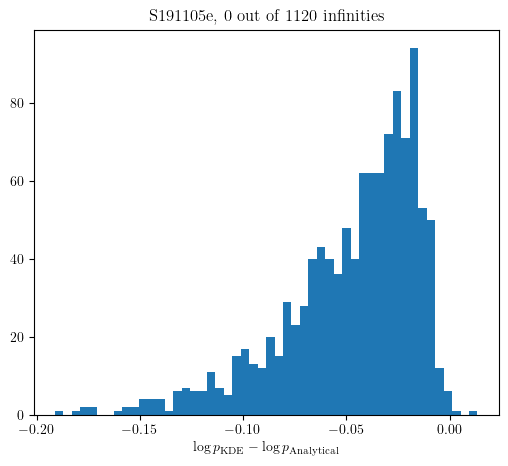

<Figure size 600x500 with 0 Axes>

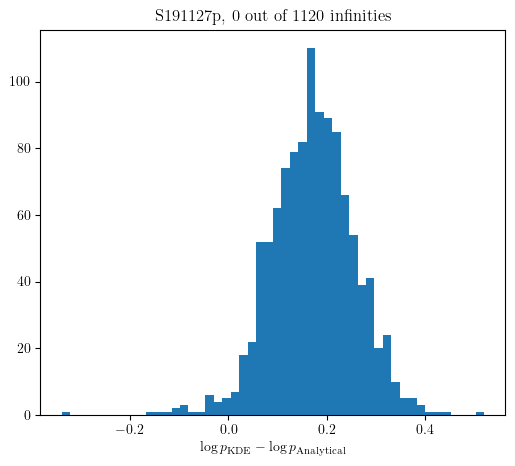

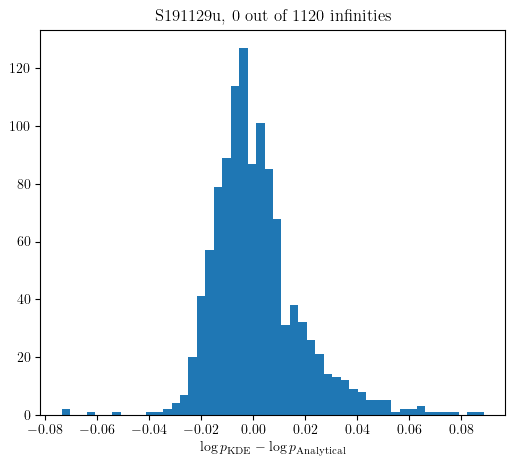

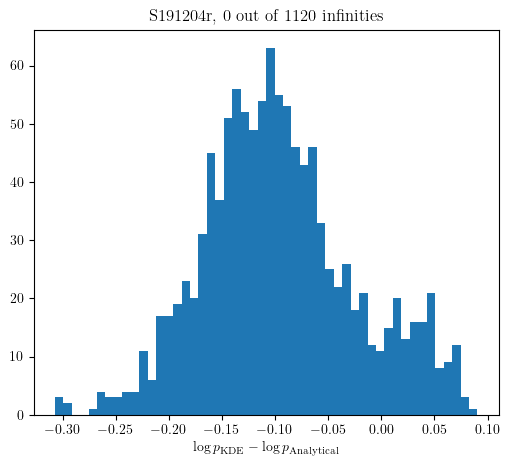

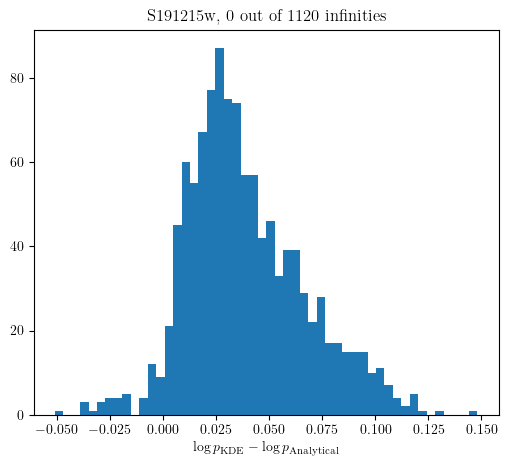

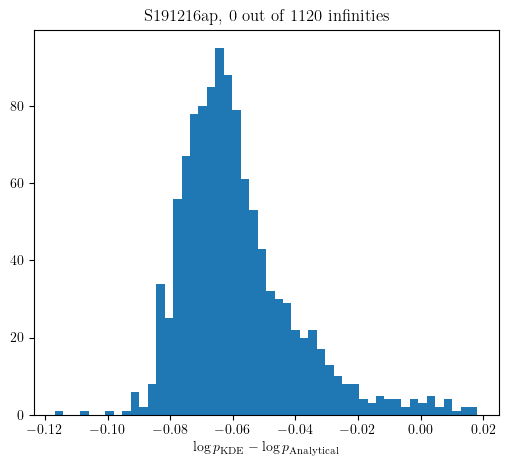

...

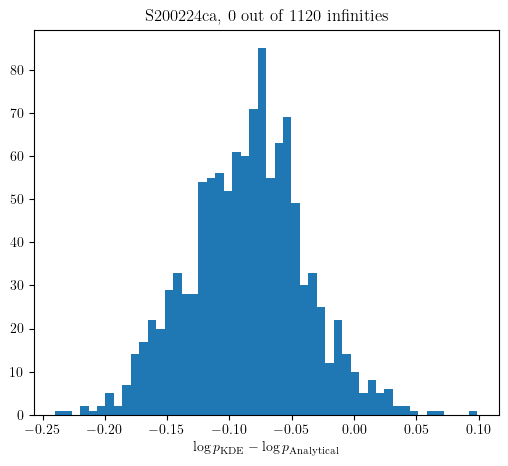

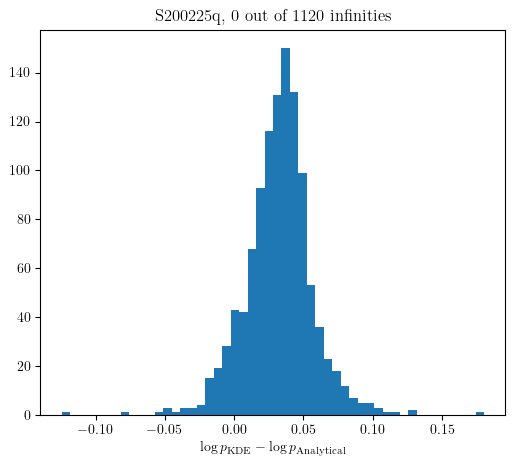

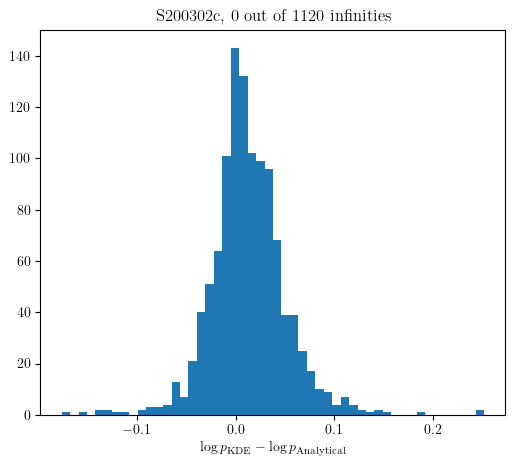

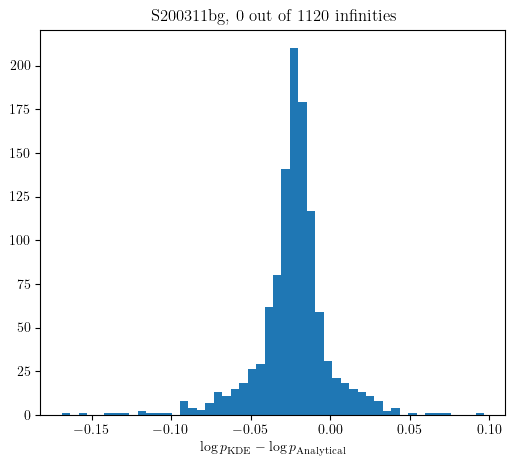

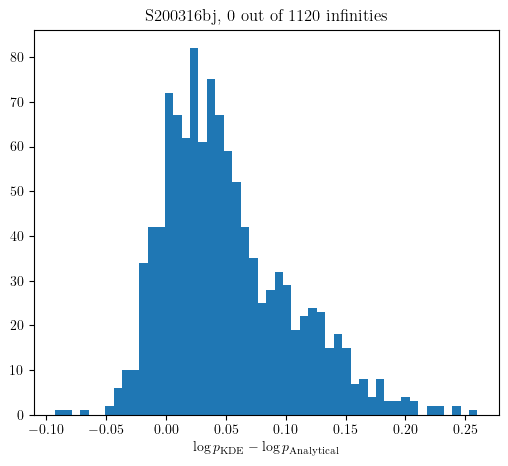

In [70]:
logps_diff = dict((k,logps_K_components[k] - logps_A_components[k]) for k in logps_K_components.keys())
bad_keys = []

for k in tqdm(logps_diff.keys()):
    plt.figure(figsize=(6,5))
    idxs = np.abs(logps_diff[k]) < np.inf
    N = len(idxs) - np.sum(idxs)
    if N > 0:
        bad_keys.append(k)
        continue
    #if N == 0:
    #    continue
    plt.hist(logps_diff[k][idxs], bins=50)
    plt.xlabel(r"$\log p_{\mathrm{KDE}} - \log p_{\mathrm{Analytical}}$")
    plt.title(f"{k}, {N} out of {len(idxs)} infinities")
    plt.show()

In [72]:
#logps_diff = dict((k,logps_A_components[k] - logps_K_components[k]) for k in logps_K_components.keys())
meds = []
for k in tqdm(logps_diff.keys()):
    idxs = np.abs(logps_diff[k]) < np.inf
    meds.append(np.median(logps_diff[k][idxs]))
    print(k,np.median(logps_diff[k][idxs]))
np.exp(np.sum(meds))

  0%|          | 0/71 [00:00<?, ?it/s]

log_prior 0.0
log_detEff 1.2844053565389686
GW150914 0.013760885196523631
GW151012 -0.026178496268494555
GW151226 -0.13053557361463985
GW170104 0.01780168599963794
GW170608 0.030810644210749638
GW170729 0.032351275211523145
GW170809 0.04033217701340863
GW170814 -0.03745796057534978
GW170818 0.014467463897121391
GW170823 0.009307528805576837
S190408an 0.014965163197317999
S190412m 0.009863774967620031
S190413ac 0.04374360241456543
S190413i 0.04212977128961093
S190421ar -0.022810711501714653
S190503bf -0.023691410563152715
S190512at -0.17936652611057502
S190513bm -0.047700410942299154
S190517h -0.10030016783124474
S190519bj -0.11630508577006982
S190521g -0.12536388025680623
S190521r -0.06208740854419359
S190527w -0.08600256951432206
S190602aq -0.0890577492108342
S190620e -0.2835819819978216
S190630ag -0.01946293187771575
S190701ah -0.03851537241324454
S190706ai -0.1915314554024885
S190707q -0.022126468096083096
S190708ap 0.05110860811336693
S190719an 0.049704315997107784
S190720a -0.1012

0.37723789860573687

(-2.199356167596975, 1.461459359697023)

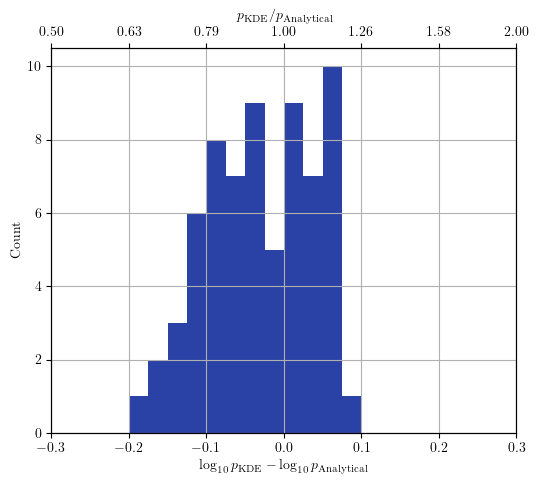

In [73]:
logps_A = np.zeros(len(logps_A_components['log_prior']))
for k in logps_A_components.keys():
    logps_A += logps_A_components[k]

idx = [np.argmax(logps_A),np.argmin(logps_A)]
argmax_diff = []
argmin_diff = []
for k in logps_diff.keys():
    argmax_diff.append(logps_diff[k][idx[0]])
    argmin_diff.append(logps_diff[k][idx[1]])
if np.abs(np.sum(argmax_diff)) == np.inf:
    raise ValueError

fig,ax = plt.subplots(figsize=(6,5))
ax.grid()
ax.hist(np.array(argmax_diff[2:])*np.log10(np.exp(1)), bins=22,range=(-0.2,0.35), color=plot_blue)
#ax.hist(np.array(argmin_diff[2:])*np.log10(np.exp(1)), color=plot_orange)
ax.set_xlabel(r"$\log_{10} p_{\mathrm{KDE}} - \log_{10} p_{\mathrm{Analytical}}$")
ax.set_ylabel('Count')
ax.set_xlim(-0.3,0.3)

# 第2軸の追加
ax2 = ax.twiny()

# 元の軸のx座標を取得
x_ticks = ax.get_xticks()

# 第2軸のティックと目盛りラベルを設定
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(x_ticks)
ax2.set_xticklabels(['{:.2f}'.format(10**x) for x in x_ticks])
ax2.set_xlabel(r"$p_{\mathrm{KDE}}/p_{\mathrm{Analytical}}$")
#ax2.set_xlabel(r'$10^x$')

plt.savefig('argmax_diff.pdf')
np.sum(np.array(argmax_diff[2:])*np.log10(np.exp(1))),argmax_diff[1]*np.log10(np.exp(1))

(1.6990701900383187, 1.6990701900383192)

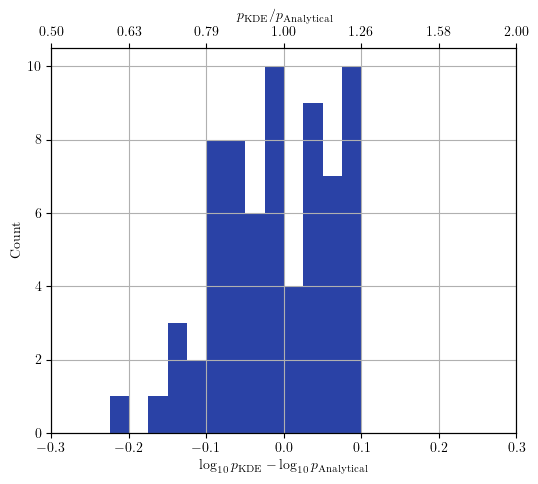

In [112]:
logps_A = np.zeros(len(logps_A_components['log_prior']))
for k in logps_A_components.keys():
    logps_A += logps_A_components[k]

idx = [np.argmax(logps_A),np.argmin(logps_A)]
argmax_diff = []
argmin_diff = []
for k in logps_diff.keys():
    argmax_diff.append(-logps_diff[k][idx[0]])
    argmin_diff.append(-logps_diff[k][idx[1]])
if np.abs(np.sum(argmax_diff)) == np.inf:
    raise ValueError

fig,ax = plt.subplots(figsize=(6,5))
ax.grid()
ax.hist(-np.array(argmax_diff[2:]+argmax_diff[1]/(len(argmax_diff)-2))*np.log10(np.exp(1)), bins=20,range=(-0.3,0.2), color=plot_blue)
#ax.hist(np.array(argmin_diff[2:])*np.log10(np.exp(1)), color=plot_orange)
ax.set_xlabel(r"$\log_{10} p_{\mathrm{KDE}} - \log_{10} p_{\mathrm{Analytical}}$")
ax.set_ylabel('Count')
ax.set_xlim(-0.3,0.3)

# 第2軸の追加
ax2 = ax.twiny()

# 元の軸のx座標を取得
x_ticks = ax.get_xticks()

# 第2軸のティックと目盛りラベルを設定
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(x_ticks)
ax2.set_xticklabels(['{:.2f}'.format(10**x) for x in x_ticks])
ax2.set_xlabel(r"$p_{\mathrm{KDE}}/p_{\mathrm{Analytical}}$")
#ax2.set_xlabel(r'$10^x$')

plt.savefig('argmax_diff.pdf')
np.sum(np.array(argmax_diff[2:]+argmax_diff[1]/(len(argmax_diff)-2))),np.sum(argmax_diff)

In [91]:
argmax_diff

[-0.0,
 -3.365134535654988,
 -0.041946412122984,
 0.053226330739052585,
 0.2541204218185782,
 -0.04433809331023664,
 -0.1527964436334317,
 -0.055333839706520394,
 -0.04856083133804834,
 0.0690235480686816,
 -0.17613058310721819,
 -0.06266913879803493,
 -0.09016320731258443,
 -0.02211037628810253,
 0.022239969281416805,
 -0.15544780264659952,
 0.1640754834647815,
 0.1849340877966732,
 0.2281005550746702,
 0.2386852475396708,
 -0.10101312319037525,
 0.06490362071613731,
 0.27194461878734977,
 0.35794893674852446,
 -0.16351819546479796,
 0.07913069166679065,
 0.31883284538179346,
 -0.024802209713585377,
 0.23669412942160228,
 0.27101810240978175,
 0.18917590950929686,
 -0.1170553534035852,
 -0.1543782749411804,
 0.16677765645024856,
 0.14755150378511495,
 0.03764918407799556,
 0.128768138089566,
 -0.14448271462555873,
 0.3403302749797028,
 0.06299491263376211,
 0.036126575456271404,
 0.11079391591818766,
 0.21601650892241686,
 -0.06791897969720395,
 -0.026330081762897417,
 0.0619413301783

In [92]:
np.argmax(argmax_diff)

57

In [93]:
list(logps_A_components.keys())[np.argmax(argmax_diff)]

'S191230an'

In [94]:
list(processed_samps_A[idx[0]])

[-3.0819902643169983,
 85.15705883075107,
 33.891348839832006,
 1.0374044470861086,
 0.0712465027352846,
 3.5523164998323247,
 1.1120464991386645,
 0.03125301927255707,
 0.14086822229648352,
 0.067068930856376,
 0.07460559243835616,
 0.4944156013037449]

In [95]:
argmax_diff[1]

-3.365134535654988

In [96]:
10 ** x_ticks

array([0.50118723, 0.63095734, 0.79432823, 1.        , 1.25892541,
       1.58489319, 1.99526231])

In [97]:
processed_samps[idx]

array([[-3.08199026e+00,  8.51570588e+01,  3.38913488e+01,
         1.03740445e+00,  7.12465027e-02,  3.55231650e+00,
         1.11204650e+00,  3.12530193e-02,  1.40868222e-01,
         6.70689309e-02,  7.46055924e-02,  4.94415601e-01],
       [-4.05617858e+00,  9.93587264e+01,  3.15825285e+01,
         4.80249253e+00,  3.60065507e-02,  2.83631610e+00,
         5.60720992e+00,  3.78712155e-02,  1.45162460e-01,
         2.36043109e-01,  5.22062292e-01,  2.98724141e-01]])

In [98]:
argmax_diff[2:]

[-0.041946412122984,
 0.053226330739052585,
 0.2541204218185782,
 -0.04433809331023664,
 -0.1527964436334317,
 -0.055333839706520394,
 -0.04856083133804834,
 0.0690235480686816,
 -0.17613058310721819,
 -0.06266913879803493,
 -0.09016320731258443,
 -0.02211037628810253,
 0.022239969281416805,
 -0.15544780264659952,
 0.1640754834647815,
 0.1849340877966732,
 0.2281005550746702,
 0.2386852475396708,
 -0.10101312319037525,
 0.06490362071613731,
 0.27194461878734977,
 0.35794893674852446,
 -0.16351819546479796,
 0.07913069166679065,
 0.31883284538179346,
 -0.024802209713585377,
 0.23669412942160228,
 0.27101810240978175,
 0.18917590950929686,
 -0.1170553534035852,
 -0.1543782749411804,
 0.16677765645024856,
 0.14755150378511495,
 0.03764918407799556,
 0.128768138089566,
 -0.14448271462555873,
 0.3403302749797028,
 0.06299491263376211,
 0.036126575456271404,
 0.11079391591818766,
 0.21601650892241686,
 -0.06791897969720395,
 -0.026330081762897417,
 0.061941330178383325,
 0.05106374936503322,

In [99]:
argmax_diff[2:]

[-0.041946412122984,
 0.053226330739052585,
 0.2541204218185782,
 -0.04433809331023664,
 -0.1527964436334317,
 -0.055333839706520394,
 -0.04856083133804834,
 0.0690235480686816,
 -0.17613058310721819,
 -0.06266913879803493,
 -0.09016320731258443,
 -0.02211037628810253,
 0.022239969281416805,
 -0.15544780264659952,
 0.1640754834647815,
 0.1849340877966732,
 0.2281005550746702,
 0.2386852475396708,
 -0.10101312319037525,
 0.06490362071613731,
 0.27194461878734977,
 0.35794893674852446,
 -0.16351819546479796,
 0.07913069166679065,
 0.31883284538179346,
 -0.024802209713585377,
 0.23669412942160228,
 0.27101810240978175,
 0.18917590950929686,
 -0.1170553534035852,
 -0.1543782749411804,
 0.16677765645024856,
 0.14755150378511495,
 0.03764918407799556,
 0.128768138089566,
 -0.14448271462555873,
 0.3403302749797028,
 0.06299491263376211,
 0.036126575456271404,
 0.11079391591818766,
 0.21601650892241686,
 -0.06791897969720395,
 -0.026330081762897417,
 0.061941330178383325,
 0.05106374936503322,

In [100]:
np.exp(np.sum(argmax_diff))

5.468860026420647

In [101]:
bad_keys

['GW170729',
 'S190412m',
 'S190517h',
 'S190521g',
 'S190620e',
 'S190805bq',
 'S190929d',
 'S191109d']

In [102]:
len(logps_diff['log_prior'])

1120

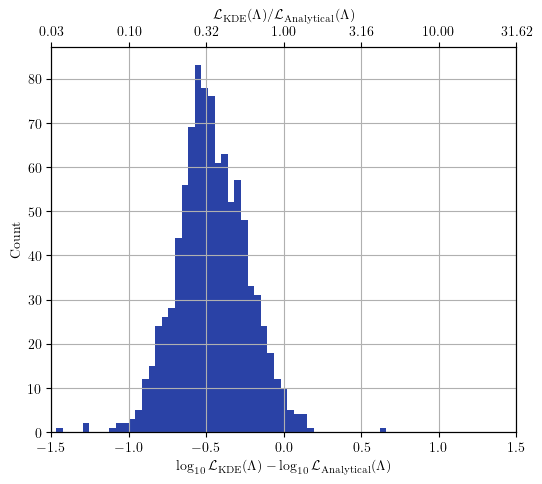

-0.47629212788958114
0.33621440233708727
0.38515783667616044


In [117]:
overall_weight = []
bad_sample = 0

#直感的になるように、overall_weightはlog_10で与える
for i in range(len(logps_diff['log_prior'])):
    ans = 0
    for k in logps_diff.keys():
        ans += logps_diff[k][i]
    #if np.abs(ans) < np.infty:
    overall_weight.append(ans*np.log10(np.exp(1)))
    #else:
    #    bad_sample += 1
        
overall_weight = np.array(overall_weight)
fig,ax = plt.subplots(figsize=(6,5))
ax.grid()
ax.hist(overall_weight[np.abs(overall_weight) < np.inf], bins=50, color=plot_blue)
ax.set_xlabel(r"$\log_{10} \mathcal{L}_{\mathrm{KDE}}(\Lambda) - \log_{10} \mathcal{L}_{\mathrm{Analytical}}(\Lambda)$")
ax.set_ylabel('Count')
ax.set_xlim(-1.5,1.5)

# 第2軸の追加
ax2 = ax.twiny()

# 元の軸のx座標を取得
x_ticks = ax.get_xticks()

# 10^xの値に変換
x_ticks_10 = 10**x_ticks

# 第2軸のティックと目盛りラベルを設定
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(x_ticks)
#ax2.set_xticklabels([f'$10^{{{x:.1f}}}$' for x in x_ticks])
ax2.set_xticklabels(['{:.2f}'.format(10**x) for x in x_ticks])
ax2.set_xlabel(r"$\mathcal{L}_{\mathrm{KDE}}(\Lambda)/\mathcal{L}_{\mathrm{Analytical}}(\Lambda)$")
#ax2.set_xlabel(r'$10^x$')

plt.savefig('diff_loglikelihood_hist.pdf')
plt.show()
print(np.median(overall_weight[np.abs(overall_weight)<np.inf]))#,len(overall_weight)
print(np.median(overall_weight[np.abs(overall_weight)<np.inf])-np.quantile(overall_weight[np.abs(overall_weight)<np.inf],.05))
print(np.quantile(overall_weight[np.abs(overall_weight)<np.inf],.95)-np.median(overall_weight[np.abs(overall_weight)<np.inf]))

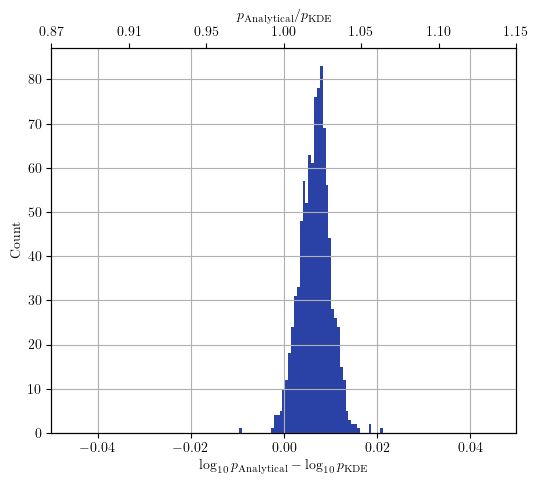

(0.4633635016007652, 1120)

In [45]:
overall_weight = []
bad_sample = 0

#直感的になるように、overall_weightはlog_10で与える
for i in range(len(logps_diff['log_prior'])):
    ans = 0
    for k in logps_diff.keys():
        ans += logps_diff[k][i]
    #if np.abs(ans) < np.infty:
    overall_weight.append(ans*np.log10(np.exp(1)))
    #else:
    #    bad_sample += 1
        
overall_weight = np.array(overall_weight)
fig,ax = plt.subplots(figsize=(6,5))
ax.grid()
ax.hist(overall_weight[np.abs(overall_weight) < np.inf]/(-2+len(logps_diff)), bins=50, color=plot_blue)
ax.set_xlabel(r"$\log_{10} p_{\mathrm{Analytical}} - \log_{10} p_{\mathrm{KDE}}$")
ax.set_ylabel('Count')
ax.set_xlim(-.05,.05)

# 第2軸の追加
ax2 = ax.twiny()

# 元の軸のx座標を取得
x_ticks = ax.get_xticks()

# 10^xの値に変換
x_ticks_10 = 10**x_ticks

# 第2軸のティックと目盛りラベルを設定
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(x_ticks)
#ax2.set_xticklabels([f'$10^{{{x:.1f}}}$' for x in x_ticks])
ax2.set_xticklabels(['{:.2f}'.format(10**x) for x in x_ticks])
ax2.set_xlabel(r"$p_{\mathrm{Analytical}}/p_{\mathrm{KDE}}$")
#ax2.set_xlabel(r'$10^x$')


plt.show()
np.mean(overall_weight[np.abs(overall_weight)<np.inf]),len(overall_weight)

In [46]:
len(logps_diff)

71

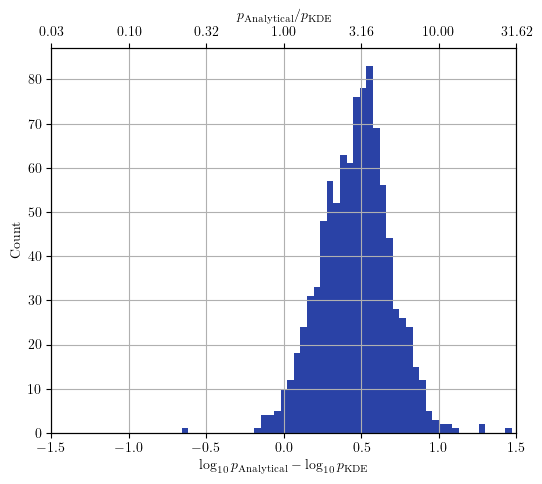

(0.4633635016007652, 1120)

In [51]:
overall_weight = []
bad_sample = 0

#直感的になるように、overall_weightはlog_10で与える
for i in range(len(logps_diff['log_prior'])):
    ans = 0
    for k in logps_diff.keys():
        ans += logps_diff[k][i]
    #if np.abs(ans) < np.infty:
    overall_weight.append(ans*np.log10(np.exp(1)))
    #else:
    #    bad_sample += 1
        
overall_weight = np.array(overall_weight)
fig,ax = plt.subplots(figsize=(6,5))
ax.grid()
ax.hist(overall_weight[np.abs(overall_weight) < np.inf], bins=50, color=plot_blue)
ax.set_xlabel(r"$\log_{10} p_{\mathrm{Analytical}} - \log_{10} p_{\mathrm{KDE}}$")
ax.set_ylabel('Count')
ax.set_xlim(-1.5,1.5)

# 第2軸の追加
ax2 = ax.twiny()

# 元の軸のx座標を取得
x_ticks = ax.get_xticks()

# 10^xの値に変換
x_ticks_10 = 10**x_ticks

# 第2軸のティックと目盛りラベルを設定
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(x_ticks)
#ax2.set_xticklabels([f'$10^{{{x:.1f}}}$' for x in x_ticks])
ax2.set_xticklabels(['{:.2f}'.format(10**x) for x in x_ticks])
ax2.set_xlabel(r"$p_{\mathrm{Analytical}}/p_{\mathrm{KDE}}$")
#ax2.set_xlabel(r'$10^x$')


plt.show()
np.mean(overall_weight[np.abs(overall_weight)<np.inf]),len(overall_weight)

In [56]:
np.mean(overall_weight)

inf

In [57]:
bad_sample/(bad_sample + len(overall_weight))

0.0

In [58]:
len(overall_weight[overall_weight <= 0])/len(overall_weight)

0.015178571428571428

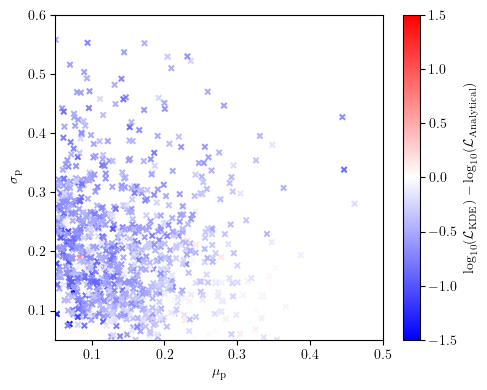

In [109]:
import matplotlib.cm as cm
plt.figure(figsize=(5,4))
sc = plt.scatter(samples['mu_p'][:],samples['sigma_p'][:],
                 vmin=-1.5,
                 vmax=1.5,
                 c =overall_weight[:],cmap=cm.bwr, s=15, marker='x')
plt.colorbar(sc,label=r'$\log_{10}(\mathcal{L}_\mathrm{KDE})-\log_{10}(\mathcal{L}_\mathrm{Analytical})$')
plt.xlim(0.05,0.5)
plt.ylim(0.05,0.6)
plt.xlabel(r'$\mu_\mathrm{p}$')
plt.ylabel(r'$\sigma_\mathrm{p}$')
plt.tight_layout()
plt.savefig('diff_loglikelihood_mup_sigp.pdf')
plt.show()

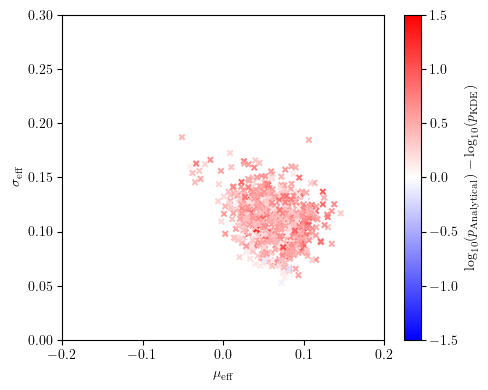

In [64]:
import matplotlib.cm as cm
plt.figure(figsize=(5,4))
sc = plt.scatter(samples['mu_eff'][:],samples['sigma_eff'][:],
                 vmin=-1.5,
                 vmax=1.5,
                 c =overall_weight[:],cmap=cm.bwr, s=15, marker='x')
plt.colorbar(sc,label=r'$\log_{10}(p_\mathrm{Analytical})-\log_{10}(p_\mathrm{KDE})$')
plt.xlim(-0.2,0.2)
plt.ylim(0,0.3)
plt.xlabel(r'$\mu_\mathrm{eff}$')
plt.ylabel(r'$\sigma_\mathrm{eff}$')
plt.tight_layout()
#plt.savefig('diff_loglikelihood.pdf')
plt.show()

  0%|          | 0/71 [00:00<?, ?it/s]

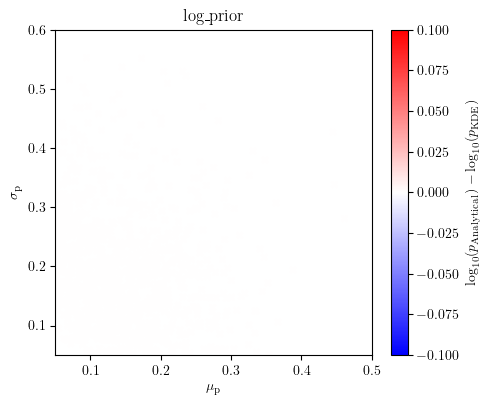

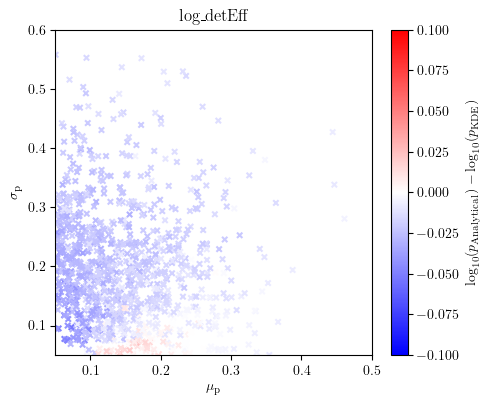

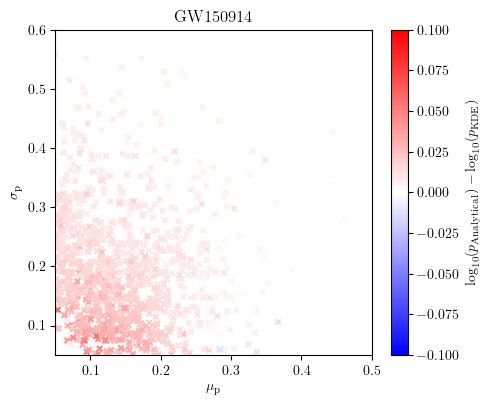

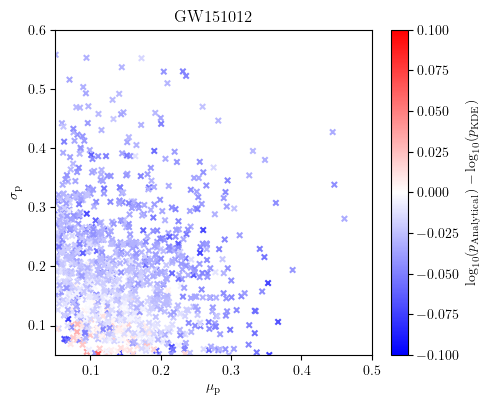

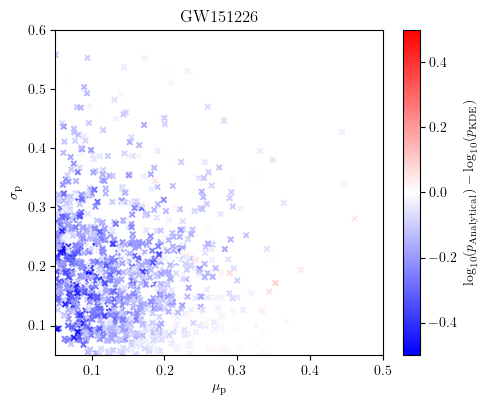

...

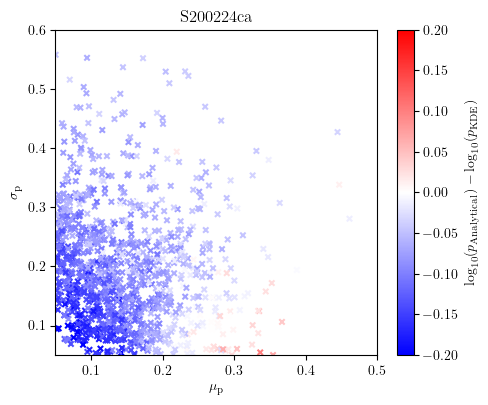

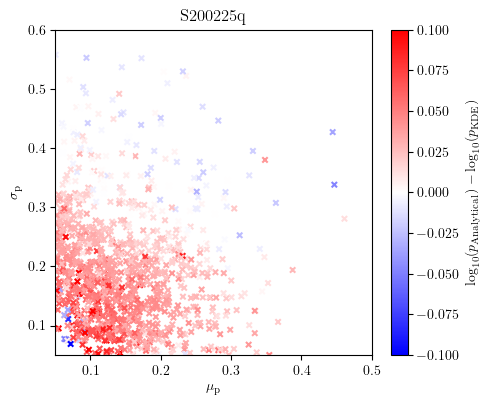

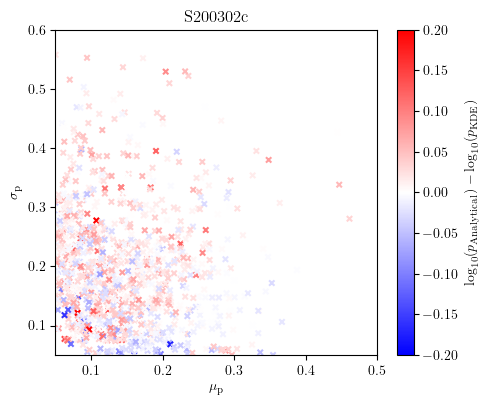

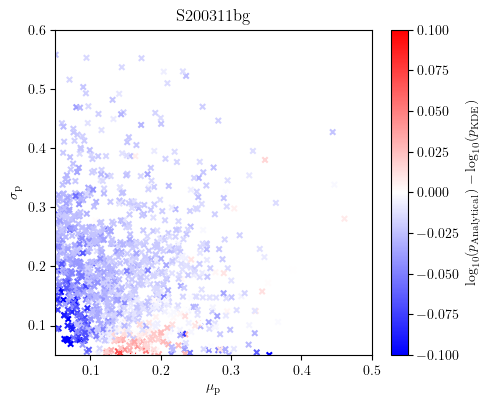

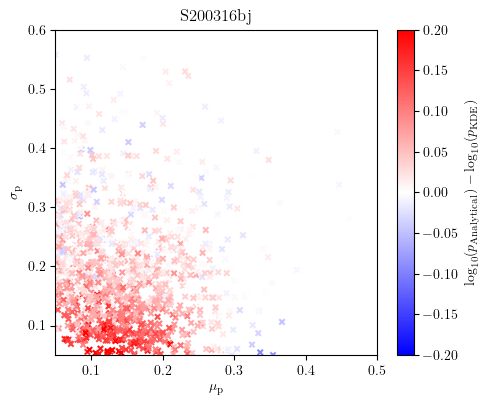

In [60]:
for k in tqdm(logps_diff.keys()):
    plt.figure(figsize=(5,4))
    idxs = np.abs(logps_diff[k]) < np.inf
    N = len(idxs) - np.sum(idxs)
    diffs = logps_diff[k][idxs]
    if k == 'log_detEff':
        diffs /= -(len(logps_diff.keys())-2)
    max_value = int(10*np.max(np.abs(diffs)))/10
        
    sc = plt.scatter(samples['mu_p'][idxs],samples['sigma_p'][idxs],
                     vmin=-max_value,vmax=max_value,
                     c =diffs,cmap=cm.bwr, s=15, marker='x')
    plt.colorbar(sc,label=r'$\log_{10}(p_\mathrm{Analytical})-\log_{10}(p_\mathrm{KDE})$')
    plt.xlim(0.05,0.5)
    plt.ylim(0.05,0.6)
    plt.xlabel(r'$\mu_\mathrm{p}$')
    plt.ylabel(r'$\sigma_\mathrm{p}$')
    plt.tight_layout()
    plt.title(k)
    #plt.savefig('diff_loglikelihood.pdf')
    plt.show()

  0%|          | 0/71 [00:00<?, ?it/s]

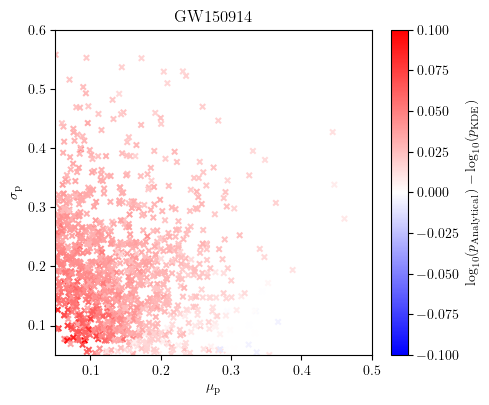

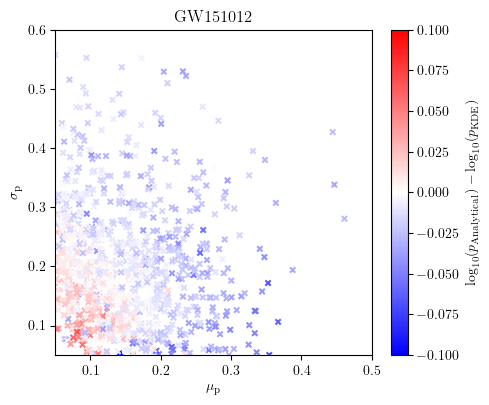

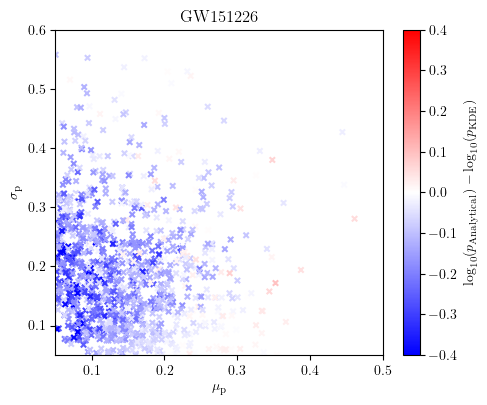

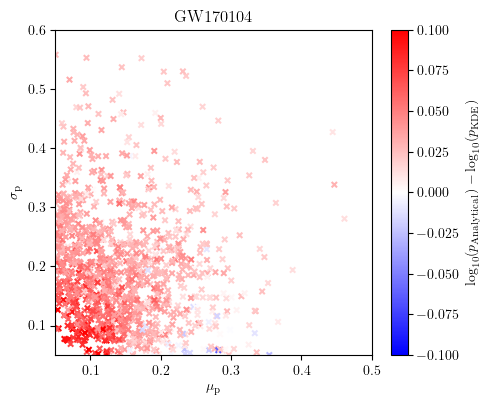

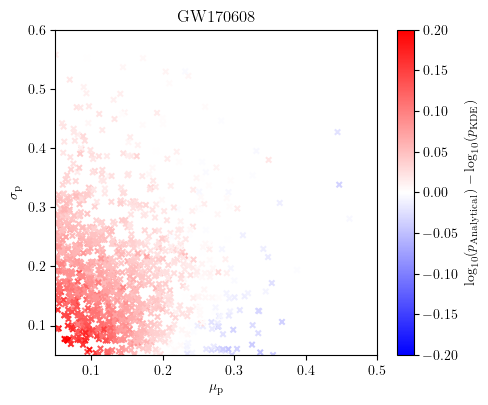

...

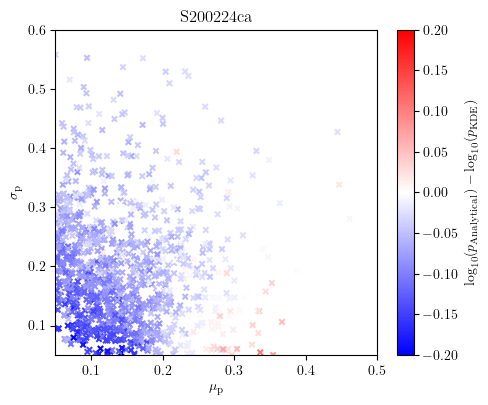

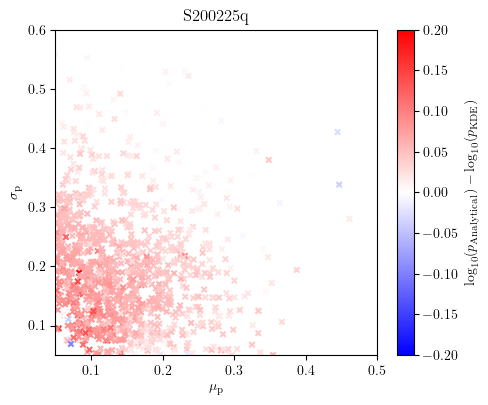

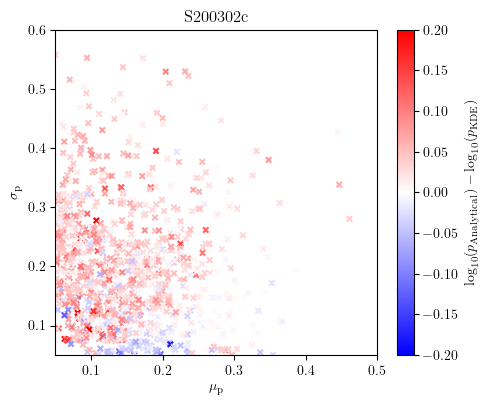

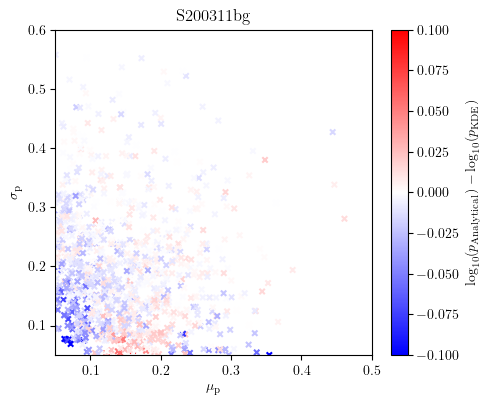

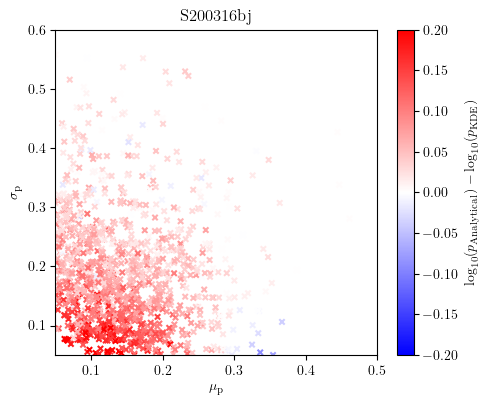

In [61]:
idxs = np.abs(logps_diff['log_detEff']) < np.inf
N = len(idxs) - np.sum(idxs)
diffs_logdet = (logps_diff['log_detEff'][idxs])/(len(logps_diff.keys())-2)


for k in tqdm(logps_diff.keys()):
    if k == 'log_prior' or k == 'log_detEff':
        continue
    plt.figure(figsize=(5,4))
    idxs = np.abs(logps_diff[k]) < np.inf
    N = len(idxs) - np.sum(idxs)
    diffs = logps_diff[k][idxs]
    diffs += diffs_logdet[idxs]
    max_value = int(10*np.max(np.abs(diffs)))/10
        
    sc = plt.scatter(samples['mu_p'][idxs],samples['sigma_p'][idxs],
                     vmin=-max_value,vmax=max_value,
                     c =diffs,cmap=cm.bwr, s=15, marker='x')
    plt.colorbar(sc,label=r'$\log_{10}(p_\mathrm{Analytical})-\log_{10}(p_\mathrm{KDE})$')
    plt.xlim(0.05,0.5)
    plt.ylim(0.05,0.6)
    plt.xlabel(r'$\mu_\mathrm{p}$')
    plt.ylabel(r'$\sigma_\mathrm{p}$')
    plt.tight_layout()
    plt.title(k)
    #plt.savefig('diff_loglikelihood.pdf')
    plt.show()

In [ ]:
import matplotlib.cm as cm
plt.figure(figsize=(5,4))
sc = plt.scatter(samples['mu_p'][:],overall_weight[:],s=20, marker='x')
plt.xlim(0.05,0.5)
plt.ylim(-1,2)
plt.xlabel(r'$\mu_\mathrm{p}$')
plt.ylabel(r'$\log_{10}(p_\mathrm{Analytical})-\log_{10}(p_\mathrm{KDE})$')
plt.tight_layout()
#plt.savefig('diff_loglikelihood.pdf')
plt.show()

In [ ]:
A_weight = []
K_weight = []
for i in range(len(logps_A_components['log_prior'])):
    ans_A = 0
    ans_K = 0
    for k in logps_A_components.keys():
        ans_A += logps_A_components[k][i]*np.log10(np.exp(1))
        ans_K += logps_K_components[k][i]*np.log10(np.exp(1))
    A_weight.append(ans_A)
    K_weight.append(ans_K)
A_weight = np.array(A_weight)
K_weight = np.array(K_weight)
plt.figure()
plt.hist(K_weight[K_weight > -np.inf],histtype='step', bins=50, density =True, range=(-760,-750),color=plot_blue,label='KDE prior')
plt.hist(A_weight[A_weight > -np.inf],histtype='step', bins=50, density =True, range=(-760,-750),color=plot_green,label='Analytical prior')
plt.xlabel(r"$\log_{10} p_{\mathrm{Analytical}}$")
plt.xlim(-760,-750)
plt.ylabel('Count')
#    plt.title(f"{k}, {N} out of {len(idxs)} infinities")
plt.show()
np.mean(A_weight),np.mean(K_weight)
#logps_A_components

In [ ]:
np.max(A_weight)

In [ ]:
import matplotlib.cm as cm
plt.figure(figsize=(7,6))
sc = plt.scatter(samples['mu_p'][:],samples['sigma_p'][:],
            vmin=np.min(A_weight),vmax=np.max(A_weight),c = A_weight[:],cmap=cm.rainbow, s=10)
plt.colorbar(sc,label=r'$\log_{10}(p_\mathrm{Analytical})$')
plt.xlim(0.05,0.5)
plt.ylim(0.05,0.6)
plt.xlabel(r'$\mu_\mathrm{p}$')
plt.ylabel(r'$\sigma_\mathrm{p}$')
plt.show()
plt.hist(samples['mu_p'],range=(0.05,0.5),bins=20)

In [ ]:
def calculate_Gaussian_2D_ipynb(chiEff, chiP, mu_eff, sigma2_eff, mu_p, sigma2_p, cov): 
    chi_min = -1
    dchi_p = 0.01
    dchi_eff = (1.-chi_min)/200

    chiEff_grid = np.arange(chi_min,1.+dchi_eff,dchi_eff)
    chiP_grid = np.arange(0.,1.+dchi_p,dchi_p)
    CHI_EFF,CHI_P = np.meshgrid(chiEff_grid,chiP_grid)


    # We need to truncate this distribution over the range chiEff=(-1,1) and chiP=(0,1)
    # Compute the correct normalization constant numerically, integrating over our precomputed grid from above
    norm_grid = np.exp(-0.5/(1.-cov**2.)*(
                    np.square(CHI_EFF-mu_eff)/sigma2_eff
                    + np.square(CHI_P-mu_p)/sigma2_p
                    - 2.*cov*(CHI_EFF-mu_eff)*(CHI_P-mu_p)/np.sqrt(sigma2_eff*sigma2_p)
                    ))
    norm = np.sum(norm_grid)*dchi_eff*dchi_p
    if norm<=1e-12:
        return np.zeros(chiEff.shape)

    # Now evaluate the gaussian at (chiEff,chiP)
    if np.isscalar(chiEff) and np.isscalar(chiP):
        # スカラー値の場合
        y = (1./norm)*np.exp(-0.5/(1.-cov**2.)*(
                                np.square(chiEff-mu_eff)/sigma2_eff
                                + np.square(chiP-mu_p)/sigma2_p
                                - (2.*cov)*(chiEff-mu_eff)*(chiP-mu_p)/np.sqrt(sigma2_eff*sigma2_p)
                                ))
        y = y if chiEff >= chi_min else 0.
    else:
        # NumPy配列の場合
        y = (1./norm)*np.exp(-0.5/(1.-cov**2.)*(
                                np.square(chiEff-mu_eff)/sigma2_eff
                                + np.square(chiP-mu_p)/sigma2_p
                                - (2.*cov)*(chiEff-mu_eff)*(chiP-mu_p)/np.sqrt(sigma2_eff*sigma2_p)
                                ))
        y[chiEff<chi_min] = 0.

    return y

In [ ]:
Nmesh = 100
Xeff_grid = np.linspace(-1,1,Nmesh)
Xp_grid = np.linspace(0,1,Nmesh)
X,Y = np.meshgrid(Xeff_grid,Xp_grid)

In [ ]:
Z = np.zeros((Nmesh,Nmesh))
for i in range(len(processed_samps_A)):
    mu_eff= processed_samps_A[i, 7]
    sigma_eff= processed_samps_A[i, 8]
    mu_p= processed_samps_A[i, 9]
    sigma_p= processed_samps_A[i, 10]
    rho= processed_samps_A[i, 11]
    Z += calculate_Gaussian_2D_ipynb(X.reshape(Nmesh*Nmesh),Y.reshape(Nmesh*Nmesh), mu_eff, sigma_eff**2, mu_p, sigma_p**2., rho).reshape((Nmesh,Nmesh))

Z /= len(processed_samps_A)
fig, ax = plt.subplots()
CS = ax.contourf(X, Y, Z.reshape((Nmesh,Nmesh)),levels=np.linspace(0,np.max(Z),201),cmap=cm.rainbow)#,levels=np.linspace(0,1,51))
dp = 0.1
while(np.max(Z)>5*dp):
        dp += 0.1
plt.colorbar(CS,ticks = list(np.arange(0,1+int(np.max(Z)),dp))+[np.max(Z)],label='PDF')
#    plt.title(r'$q={:.2f}$'.format(q))
plt.xlim(-1,1)
plt.ylim(0,1)
plt.xlabel(r'$\chi_\mathrm{eff}$')
plt.ylabel(r'$\chi_\mathrm{p}$')
#plt.savefig('2d_joint_prior_q_{:.2f}'.format(q).replace('.','p')+'.pdf')
plt.show()

In [ ]:
Z = np.zeros((Nmesh,Nmesh))
for i in range(len(processed_samps_K)):
    mu_eff= processed_samps_K[i, 7]
    sigma_eff= processed_samps_K[i, 8]
    mu_p= processed_samps_K[i, 9]
    sigma_p= processed_samps_K[i, 10]
    rho= processed_samps_K[i, 11]
    Z += calculate_Gaussian_2D_ipynb(X.reshape(Nmesh*Nmesh),Y.reshape(Nmesh*Nmesh), mu_eff, sigma_eff**2, mu_p, sigma_p**2., rho).reshape((Nmesh,Nmesh))

Z /= len(processed_samps_K)
fig, ax = plt.subplots()
CS = ax.contourf(X, Y, Z.reshape((Nmesh,Nmesh)),levels=np.linspace(0,np.max(Z),201),cmap=cm.rainbow)#,levels=np.linspace(0,1,51))
dp = 0.1
while(np.max(Z)>5*dp):
        dp += 0.1
plt.colorbar(CS,ticks = list(np.arange(0,1+int(np.max(Z)),dp))+[np.max(Z)],label='PDF')
#    plt.title(r'$q={:.2f}$'.format(q))
plt.xlim(-1,1)
plt.ylim(0,1)
plt.xlabel(r'$\chi_\mathrm{eff}$')
plt.ylabel(r'$\chi_\mathrm{p}$')
#plt.savefig('2d_joint_prior_q_{:.2f}'.format(q).replace('.','p')+'.pdf')
plt.show()

In [ ]:
from scipy import interpolate
from scipy.special import erf
from matplotlib.colors import LinearSegmentedColormap
Nmesh = 200
Xeff_grid = np.linspace(-1,1,Nmesh)
Xp_grid = np.linspace(0,1,Nmesh)
X,Y = np.meshgrid(Xeff_grid,Xp_grid)
levels = [erf(x/np.sqrt(2)) for x in [1,2]] #x sigma
colors = [plot_blue,plot_green,plot_purple]
legend_0 = []
legend_1 = []
Zs = []
fig, ax = plt.subplots(figsize=(5,4))
for j,processed_samps in enumerate([processed_samps_K,processed_samps_A]):
    Z = np.zeros((Nmesh,Nmesh))
    for i in range(len(processed_samps)):
        mu_eff= processed_samps[i, 7]
        sigma_eff= processed_samps[i, 8]
        mu_p= processed_samps[i, 9]
        sigma_p= processed_samps[i, 10]
        rho= processed_samps[i, 11]
        Z += calculate_Gaussian_2D_ipynb(X.reshape(Nmesh*Nmesh),Y.reshape(Nmesh*Nmesh),
                                         mu_eff, sigma_eff**2, mu_p, sigma_p**2., rho).reshape((Nmesh,Nmesh))
    Zs.append(Z/len(processed_samps))
    Z = Z / Z.sum()
    Neval = 1000
    t = np.linspace(0, Z.max(), Neval)
    mask = (Z >= t[:, None, None])
    re_mask = mask*Z
    integral = re_mask.sum(axis=(1,2))
    f = interpolate.interp1d(integral, t)
    t_contours = f(np.array(levels))
                    
    cmap = LinearSegmentedColormap.from_list("", ["white",colors[j]])
    cntr_analytical = ax.contour(Z,sorted(t_contours),extent=[Xeff_grid[0],Xeff_grid[-1],0,1], colors = colors[j], alpha = 0.8)
    hana,_ = cntr_analytical.legend_elements()
    ax.contourf(X, Y, Z, levels = list(sorted(t_contours))+[np.amax(Z)], alpha=0.5, cmap=cmap)
    legend_0.append(hana[0])
    legend_1.append(labels[j])
    
plt.xlim(-0.6,0.6)
plt.ylim(0,1)
plt.xlabel(r'$\chi_\mathrm{eff}$')
plt.ylabel(r'$\chi_\mathrm{p}$')
ax.legend(legend_0,legend_1)
plt.grid()
plt.savefig('PPD_2d.pdf')
plt.show()

In [ ]:
Z = Zs[0]/Zs[1]
Z = Z / Z.sum()
Neval = 1000
t = np.linspace(0, Z.max(), Neval)
mask = (Z >= t[:, None, None])
re_mask = mask*Z
integral = re_mask.sum(axis=(1,2))
f = interpolate.interp1d(integral, t)
t_contours = f(np.array(levels))

fig, ax = plt.subplots(figsize=(5,4))
cmap = LinearSegmentedColormap.from_list("", ["white",plot_green])
cntr_analytical = ax.contour(Z,sorted(t_contours),extent=[-1,1,0,1], colors = colors[j], alpha = 0.8)
hana,_ = cntr_analytical.legend_elements()
ax.contourf(X, Y, Z, levels = list(sorted(t_contours))+[np.amax(Z)], alpha=0.5, cmap=cmap)
    
plt.xlim(Xeff_grid[0],Xeff_grid[-1])
plt.ylim(0,1)
plt.xlabel(r'$\chi_\mathrm{eff}$')
plt.ylabel(r'$\chi_\mathrm{p}$')
ax.legend(legend_0,legend_1)
plt.grid()
#plt.savefig('2d_joint_prior_q_{:.2f}'.format(q).replace('.','p')+'.pdf')
plt.show()

In [ ]:
Z = Zs[0]/Zs[1]
pt

In [ ]:
Zs[1]

In [ ]:
Z

In [ ]:
legend_0

In [ ]:
t_contours

In [ ]:
calculate_Gaussian_2D_ipynb(X.reshape(Nmesh*Nmesh),Y.reshape(Nmesh*Nmesh), mu_eff, sigma_eff**2, mu_p, sigma_p**2., rho)

In [ ]:
q=0.5
(3+4*q)/(4+3*q)*q

In [ ]:
1/((3+4*q)/(4+3*q))

In [148]:
import sympy as sym
D = sym.Symbol('D')
C = sym.Symbol('C')
x = sym.Symbol('x')


a = sym.Symbol('a')
b = sym.Symbol('b')
c = sym.Symbol('c')
d = sym.Symbol('d')

expr_abcd = (a*x+b)/(x*x+1)+(c*(x-C)+d)/((x-C)**2+D*D)
expr_abcd

(a*x + b)/(x**2 + 1) + (c*(-C + x) + d)/(D**2 + (-C + x)**2)

In [149]:
expr_abd = expr_abcd.subs(c,-a)
sym.factor(expr_abd)

-(-C**2*a*x - C**2*b + C*a*x**2 - C*a + 2*C*b*x - D**2*a*x - D**2*b + a*x - b*x**2 - d*x**2 - d)/((x**2 + 1)*(C**2 - 2*C*x + D**2 + x**2))

In [150]:
expr_bd = expr_abd.subs(a,(b+d)/C)
sym.factor(expr_bd)

-(-C**3*b + C**2*b*x - C**2*d*x - C*D**2*b - C*b - 2*C*d - D**2*b*x - D**2*d*x + b*x + d*x)/(C*(x**2 + 1)*(C**2 - 2*C*x + D**2 + x**2))

In [151]:
expr_d = expr_bd.subs(b,(C*C+D*D-1)/(C*C+1-D*D)*d)
sym.factor(expr_d)

d*(C**2 + D**2 - 2*D + 1)*(C**2 + D**2 + 2*D + 1)/((x**2 + 1)*(C**2 - D**2 + 1)*(C**2 - 2*C*x + D**2 + x**2))

In [152]:
expr = expr_d.subs(d, (C*C-D*D+1)/(C*C+D*D-2*D+1)/(C*C+D*D+2*D+1)*D)
sym.factor(expr)

D/((x**2 + 1)*(C**2 - 2*C*x + D**2 + x**2))

In [143]:
d = (C*C-D*D+1)/(C*C+D*D-2*D+1)/(C*C+D*D+2*D+1)*D
b = (C*C+D*D-1)/(C*C+1-D*D)*d
sym.factor(b+d)

2*C**2*D/((C**2 + D**2 - 2*D + 1)*(C**2 + D**2 + 2*D + 1))

In [145]:
sym.factor((b+d)/2/C)

C*D/((C**2 + D**2 - 2*D + 1)*(C**2 + D**2 + 2*D + 1))

In [146]:
b

D*(C**2 + D**2 - 1)/((C**2 + D**2 - 2*D + 1)*(C**2 + D**2 + 2*D + 1))

In [147]:
d/D

(C**2 - D**2 + 1)/((C**2 + D**2 - 2*D + 1)*(C**2 + D**2 + 2*D + 1))